# Import Library: 분석에 사용할 모듈 설치
**1. Import Library**

In [1]:
!python -m pip install --user --upgrade pip

Requirement already up-to-date: pip in c:\users\kk\anaconda3\lib\site-packages (20.2.4)


In [2]:
# Ignore the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Data manipulation, visualization and useful functions
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 50
pd.options.display.max_columns = 40
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# Modeling algorithms
# General(Statistics/Econometrics)
from sklearn import preprocessing
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats

# Regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# Classification
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# Model selection
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# Evaluation metrics
# for regression
from sklearn.metrics import mean_squared_log_error, mean_squared_error,  r2_score, mean_absolute_error
# for classification
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [3]:
### Feature engineering of default
def non_feature_engineering(raw):
    if 'datetime' in raw.columns:
        raw['datetime'] = pd.to_datetime(raw['datetime'])
        raw['DateTime'] = pd.to_datetime(raw['datetime'])
    if raw.index.dtype == 'int64':
        raw.set_index('DateTime', inplace=True)
    # bring back
    # if raw.index.dtype != 'int64':
    #     raw.reset_index(drop=False, inplace=True)
    raw = raw.asfreq('H', method='ffill')
    raw_nfe = raw.copy()
    return raw_nfe
# raw_rd = non_feature_engineering(raw_all)


### Feature engineering of all
def feature_engineering(raw):
    if 'datetime' in raw.columns:
        raw['datetime'] = pd.to_datetime(raw['datetime'])
        raw['DateTime'] = pd.to_datetime(raw['datetime'])

    if raw.index.dtype == 'int64':
        raw.set_index('DateTime', inplace=True)

    raw = raw.asfreq('H', method='ffill')

    result = sm.tsa.seasonal_decompose(raw['count'], model='additive')
    Y_trend = pd.DataFrame(result.trend)
    Y_trend.fillna(method='ffill', inplace=True)
    Y_trend.fillna(method='bfill', inplace=True)
    Y_trend.columns = ['count_trend']
    Y_seasonal = pd.DataFrame(result.seasonal)
    Y_seasonal.fillna(method='ffill', inplace=True)
    Y_seasonal.fillna(method='bfill', inplace=True)
    Y_seasonal.columns = ['count_seasonal']
    pd.concat([raw, Y_trend, Y_seasonal], axis=1).isnull().sum()
    if 'count_trend' not in raw.columns:
        if 'count_seasonal' not in raw.columns:
            raw = pd.concat([raw, Y_trend, Y_seasonal], axis=1)

    Y_count_Day = raw[['count']].rolling(24).mean()
    Y_count_Day.fillna(method='ffill', inplace=True)
    Y_count_Day.fillna(method='bfill', inplace=True)
    Y_count_Day.columns = ['count_Day']
    Y_count_Week = raw[['count']].rolling(24*7).mean()
    Y_count_Week.fillna(method='ffill', inplace=True)
    Y_count_Week.fillna(method='bfill', inplace=True)
    Y_count_Week.columns = ['count_Week']
    if 'count_Day' not in raw.columns:
        raw = pd.concat([raw, Y_count_Day], axis=1)
    if 'count_Week' not in raw.columns:
        raw = pd.concat([raw, Y_count_Week], axis=1)

    Y_diff = raw[['count']].diff()
    Y_diff.fillna(method='ffill', inplace=True)
    Y_diff.fillna(method='bfill', inplace=True)
    Y_diff.columns = ['count_diff']
    if 'count_diff' not in raw.columns:
        raw = pd.concat([raw, Y_diff], axis=1)

    raw['temp_group'] = pd.cut(raw['temp'], 10)
    raw['Year'] = raw.datetime.dt.year
    raw['Quater'] = raw.datetime.dt.quarter
    raw['Quater_ver2'] = raw['Quater'] + (raw.Year - raw.Year.min()) * 4
    raw['Month'] = raw.datetime.dt.month
    raw['Day'] = raw.datetime.dt.day
    raw['Hour'] = raw.datetime.dt.hour
    raw['DayofWeek'] = raw.datetime.dt.dayofweek

    raw['count_lag1'] = raw['count'].shift(1)
    raw['count_lag2'] = raw['count'].shift(2)
    raw['count_lag1'].fillna(method='bfill', inplace=True)
    raw['count_lag2'].fillna(method='bfill', inplace=True)

    if 'Quater' in raw.columns:
        if 'Quater_Dummy' not in ['_'.join(col.split('_')[:2]) for col in raw.columns]:
            raw = pd.concat([raw, pd.get_dummies(raw['Quater'], 
                                                 prefix='Quater_Dummy', drop_first=True)], axis=1)
            del raw['Quater']
    raw_fe = raw.copy()
    return raw_fe
# raw_fe = feature_engineering(raw_all)


### Data split of cross sectional
def datasplit_cs(raw, Y_colname, X_colname, test_size, random_seed=123):
    X_train, X_test, Y_train, Y_test = train_test_split(raw[X_colname], raw[Y_colname], test_size=test_size, random_state=random_seed)
    print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
    print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
    return X_train, X_test, Y_train, Y_test
# X_train, X_test, Y_train, Y_test = datasplit_cs(raw_fe, Y_colname, X_colname, 0.2)


### Data split of time series
def datasplit_ts(raw, Y_colname, X_colname, criteria):
    raw_train = raw.loc[raw.index < criteria,:]
    raw_test = raw.loc[raw.index >= criteria,:]
    Y_train = raw_train[Y_colname]
    X_train = raw_train[X_colname]
    Y_test = raw_test[Y_colname]
    X_test = raw_test[X_colname]
    print('Train_size:', raw_train.shape, 'Test_size:', raw_test.shape)
    print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
    print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
    return X_train, X_test, Y_train, Y_test
# X_train, X_test, Y_train, Y_test = datasplit_ts(raw_fe, Y_colname, X_colname, '2012-07-01')


### Evaluation of 1 pair of set
def evaluation(Y_real, Y_pred, graph_on=False):
    loss_length = len(Y_real.values.flatten()) - len(Y_pred)
    if loss_length != 0:
        Y_real = Y_real[loss_length:]
    if graph_on == True:
        pd.concat([Y_real, pd.DataFrame(Y_pred, index=Y_real.index, columns=['prediction'])], axis=1).plot(kind='line', figsize=(20,6),
                                                                                                           xlim=(Y_real.index.min(),Y_real.index.max()),
                                                                                                           linewidth=3, fontsize=20)
        plt.title('Time Series of Target', fontsize=20)
        plt.xlabel('Index', fontsize=15)
        plt.ylabel('Target Value', fontsize=15)
    MAE = abs(Y_real.values.flatten() - Y_pred).mean()
    MSE = ((Y_real.values.flatten() - Y_pred)**2).mean()
    MAPE = (abs(Y_real.values.flatten() - Y_pred)/Y_real.values.flatten()*100).mean()
    Score = pd.DataFrame([MAE, MSE, MAPE], index=['MAE', 'MSE', 'MAPE'], columns=['Score']).T
    Residual = pd.DataFrame(Y_real.values.flatten() - Y_pred, index=Y_real.index, columns=['Error'])
    return Score, Residual
# Score_tr, Residual_tr = evaluation(Y_train, pred_tr_reg1, graph_on=True)


### Evaluation of train/test pairs
def evaluation_trte(Y_real_tr, Y_pred_tr, Y_real_te, Y_pred_te, graph_on=False):
    Score_tr, Residual_tr = evaluation(Y_real_tr, Y_pred_tr, graph_on=graph_on)
    Score_te, Residual_te = evaluation(Y_real_te, Y_pred_te, graph_on=graph_on)
    Score_trte = pd.concat([Score_tr, Score_te], axis=0)
    Score_trte.index = ['Train', 'Test']
    return Score_trte, Residual_tr, Residual_te
# Score_reg1, Resid_tr_reg1, Resid_te_reg1 = evaluation_trte(Y_train, pred_tr_reg1, Y_test, pred_te_reg1, graph_on=True)


### Error analysis
def stationarity_adf_test(Y_Data, Target_name):
    if len(Target_name) == 0:
        Stationarity_adf = pd.Series(sm.tsa.stattools.adfuller(Y_Data)[0:4],
                                     index=['Test Statistics', 'p-value', 'Used Lag', 'Used Observations'])
        for key, value in sm.tsa.stattools.adfuller(Y_Data)[4].items():
            Stationarity_adf['Critical Value(%s)'%key] = value
            Stationarity_adf['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(Y_Data)[5]
            Stationarity_adf = pd.DataFrame(Stationarity_adf, columns=['Stationarity_adf'])
    else:
        Stationarity_adf = pd.Series(sm.tsa.stattools.adfuller(Y_Data[Target_name])[0:4],
                                     index=['Test Statistics', 'p-value', 'Used Lag', 'Used Observations'])
        for key, value in sm.tsa.stattools.adfuller(Y_Data[Target_name])[4].items():
            Stationarity_adf['Critical Value(%s)'%key] = value
            Stationarity_adf['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(Y_Data[Target_name])[5]
            Stationarity_adf = pd.DataFrame(Stationarity_adf, columns=['Stationarity_adf'])
    return Stationarity_adf

def stationarity_kpss_test(Y_Data, Target_name):
    if len(Target_name) == 0:
        Stationarity_kpss = pd.Series(sm.tsa.stattools.kpss(Y_Data)[0:3],
                                      index=['Test Statistics', 'p-value', 'Used Lag'])
        for key, value in sm.tsa.stattools.kpss(Y_Data)[3].items():
            Stationarity_kpss['Critical Value(%s)'%key] = value
            Stationarity_kpss = pd.DataFrame(Stationarity_kpss, columns=['Stationarity_kpss'])
    else:
        Stationarity_kpss = pd.Series(sm.tsa.stattools.kpss(Y_Data[Target_name])[0:3],
                                      index=['Test Statistics', 'p-value', 'Used Lag'])
        for key, value in sm.tsa.stattools.kpss(Y_Data[Target_name])[3].items():
            Stationarity_kpss['Critical Value(%s)'%key] = value
            Stationarity_kpss = pd.DataFrame(Stationarity_kpss, columns=['Stationarity_kpss'])
    return Stationarity_kpss

def error_analysis(Y_Data, Target_name, X_Data, graph_on=False):
    for x in Target_name:
        Target_name = x
    X_Data = X_Data.loc[Y_Data.index]

    if graph_on == True:
        ##### Error Analysis(Plot)
        Y_Data['RowNum'] = Y_Data.reset_index().index

        # Stationarity(Trend) Analysis
        sns.set(palette="muted", color_codes=True, font_scale=2)
        sns.lmplot(x='RowNum', y=Target_name, data=Y_Data, fit_reg='True', size=5.2, aspect=2, ci=99, sharey=True)
        del Y_Data['RowNum']

        # Normal Distribution Analysis
        figure, axes = plt.subplots(figsize=(12,8))
        sns.distplot(Y_Data[Target_name], norm_hist='True', fit=stats.norm, ax=axes)

        # Lag Analysis
        length = int(len(Y_Data[Target_name])/10)
        figure, axes = plt.subplots(1, 4, figsize=(12,3))
        pd.plotting.lag_plot(Y_Data[Target_name], lag=1, ax=axes[0])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=5, ax=axes[1])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=10, ax=axes[2])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=50, ax=axes[3])

        # Autocorrelation Analysis
        figure, axes = plt.subplots(2,1,figsize=(12,5))
        sm.tsa.graphics.plot_acf(Y_Data[Target_name], lags=100, use_vlines=True, ax=axes[0])
        sm.tsa.graphics.plot_pacf(Y_Data[Target_name], lags=100, use_vlines=True, ax=axes[1])

    ##### Error Analysis(Statistics)
    # Checking Stationarity
    # Null Hypothesis: The Time-series is non-stationalry
    Stationarity_adf = stationarity_adf_test(Y_Data, Target_name)
    Stationarity_kpss = stationarity_kpss_test(Y_Data, Target_name)

    # Checking of Normality
    # Null Hypothesis: The residuals are normally distributed
    Normality = pd.DataFrame([stats.shapiro(Y_Data[Target_name])],
                             index=['Normality'], columns=['Test Statistics', 'p-value']).T

    # Checking for Autocorrelation
    # Null Hypothesis: Autocorrelation is absent
    Autocorrelation = pd.concat([pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])[0], columns=['Test Statistics']),
                                 pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])[1], columns=['p-value'])], axis=1).T
    Autocorrelation.columns = ['Autocorr(lag1)', 'Autocorr(lag5)', 'Autocorr(lag10)', 'Autocorr(lag50)']

    # Checking Heteroscedasticity
    # Null Hypothesis: Error terms are homoscedastic
    Heteroscedasticity = pd.DataFrame([sm.stats.diagnostic.het_goldfeldquandt(Y_Data[Target_name], X_Data.values, alternative='two-sided')],
                                      index=['Heteroscedasticity'], columns=['Test Statistics', 'p-value', 'Alternative']).T
    Score = pd.concat([Stationarity_adf, Stationarity_kpss, Normality, Autocorrelation, Heteroscedasticity], join='outer', axis=1)
    index_new = ['Test Statistics', 'p-value', 'Alternative', 'Used Lag', 'Used Observations',
                 'Critical Value(1%)', 'Critical Value(5%)', 'Critical Value(10%)', 'Maximum Information Criteria']
    Score.reindex(index_new)
    return Score
# error_analysis(Resid_tr_reg1[1:], ['Error'], X_train, graph_on=True)

In [4]:
### Functionalize
### duplicate previous year values to next one
def feature_engineering_year_duplicated(raw, target):
    raw_fe = raw.copy()
    for col in target:
        raw_fe.loc['2012-01-01':'2012-02-28', col] = raw.loc['2011-01-01':'2011-02-28', col].values
        raw_fe.loc['2012-03-01':'2012-12-31', col] = raw.loc['2011-03-01':'2011-12-31', col].values
        step = (raw.loc['2011-03-01 00:00:00', col] - raw.loc['2011-02-28 23:00:00', col])/25
        step_value = np.arange(raw.loc['2011-02-28 23:00:00', col]+step, raw.loc['2011-03-01 00:00:00', col], step)
        step_value = step_value[:24]
        raw_fe.loc['2012-02-29', col] = step_value
    return raw_fe
# target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
# raw_fe = feature_engineering_year_duplicated(raw_fe, target)

### modify lagged values of X_test
def feature_engineering_lag_modified(Y_test, X_test, target):
    X_test_lm = X_test.copy()
    for col in target:
        X_test_lm[col] = Y_test.shift(1).values
        X_test_lm[col].fillna(method='bfill', inplace=True)
        X_test_lm[col] = Y_test.shift(2).values
        X_test_lm[col].fillna(method='bfill', inplace=True)
    return X_test_lm
# target = ['count_lag1', 'count_lag2']
# X_test_fe = feature_engineering_lag_modified(Y_test_fe, X_test_fe, target)

### scaling of X_train and X_test by X_train_scaler
def feature_engineering_scaling(scaler, X_train, X_test):
    # preprocessing.MinMaxScaler()
    # preprocessing.StandardScaler()
    # preprocessing.RobustScaler()
    # preprocessing.Normalizer()
    scaler = scaler
    scaler_fit = scaler.fit(X_train)
    X_train_scaling = pd.DataFrame(scaler_fit.transform(X_train), 
                               index=X_train.index, columns=X_train.columns)
    X_test_scaling = pd.DataFrame(scaler_fit.transform(X_test), 
                               index=X_test.index, columns=X_test.columns)
    return X_train_scaling, X_test_scaling
# X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)

### extract non-multicollinearity variables by VIF 
def feature_engineering_XbyVIF(X_train, num_variables):
    vif = pd.DataFrame()
    vif['VIF_Factor'] = [variance_inflation_factor(X_train.values, i) 
                         for i in range(X_train.shape[1])]
    vif['Feature'] = X_train.columns
    X_colname_vif = vif.sort_values(by='VIF_Factor', ascending=True)['Feature'][:num_variables].values
    return X_colname_vif
# X_colname_vif = feature_engineering_XbyVIF(X_train_femm, 10)
# X_colname_vif

# Base분석 결과확인

## Code Summary (Raw Data)

Train_size: (13128, 12) Test_size: (4416, 12)
X_train: (13128, 8) Y_train: (13128, 1)
X_test: (4416, 8) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  count   R-squared (uncentered):                   0.638
Model:                            OLS   Adj. R-squared (uncentered):              0.638
Method:                 Least Squares   F-statistic:                              2889.
Date:                Sun, 25 Oct 2020   Prob (F-statistic):                        0.00
Time:                        20:09:20   Log-Likelihood:                         -83421.
No. Observations:               13128   AIC:                                  1.669e+05
Df Residuals:                   13120   BIC:                                  1.669e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
season         3.3659      1.286      2.618      0.009       0.846       5.886
holiday       -6.2896      7.466     -0.842      0.400     -20.924       8.345
workingday    10.3553      2.641      3.921      0.000       5.178      15.533
weather        7.1906      2.093      3.436      0.001       3.089      11.292
temp          -7.8544      1.222     -6.429      0.000     -10.249      -5.460
atemp         16.0695      1.095     14.676      0.000      13.923      18.216
humidity      -1.7353      0.063    -27.356      0.000      -1.860      -1.611
windspeed      2.2749      0.136     16.745      0.000       2.009       2.541
==============================================================================
Omnibus:                     2168.771   Durbin-Watson:                   0.419
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3942.747
Skew:                           1.050   Prob(JB):                         0.00
Kurtosis:                       4.672   Cond. No.                         450.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.25,11.19,0.94,"8,204.84","12,494.43","13,138.03","48,485.56",1.76
p-value,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,40.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,087.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"143,252.82",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


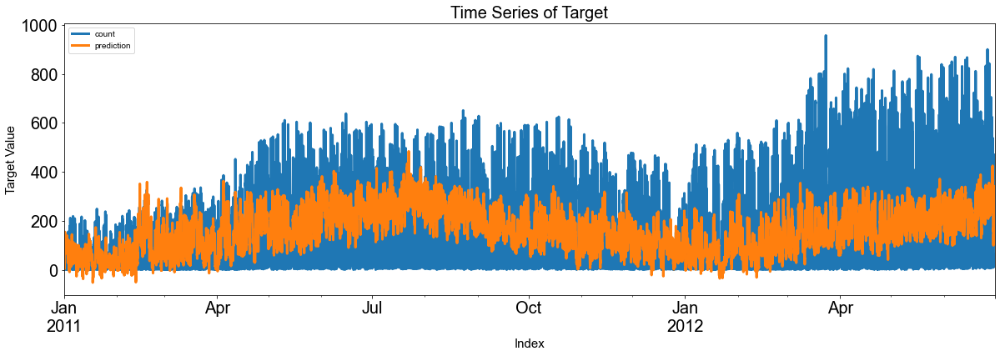

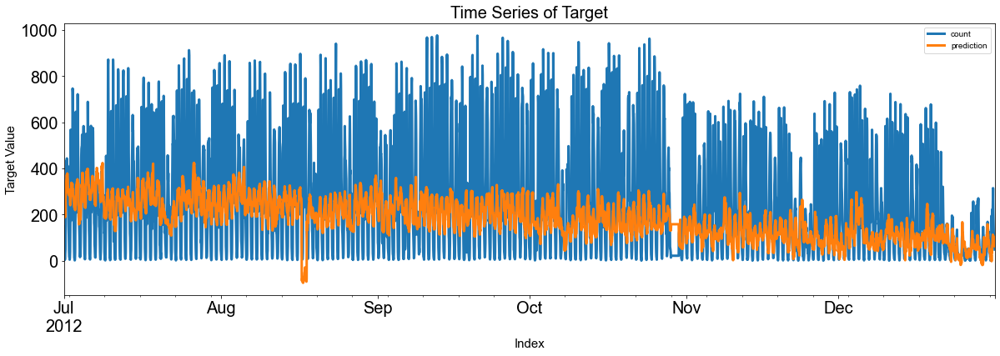

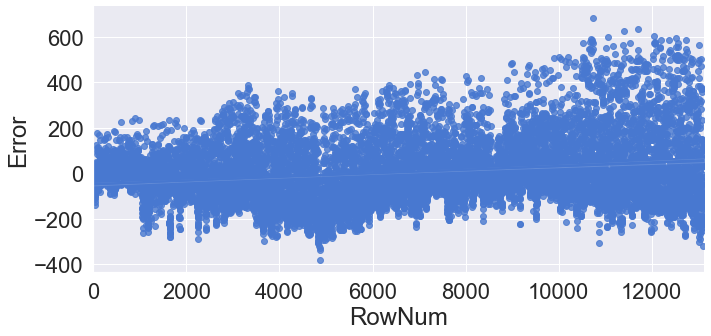

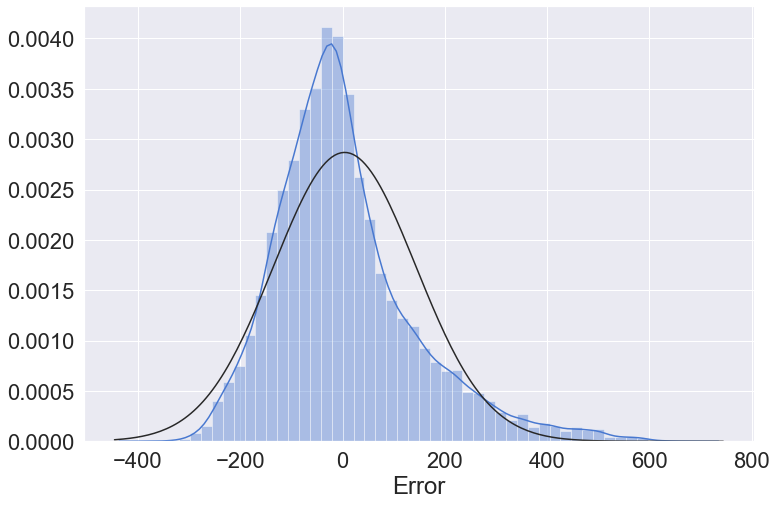

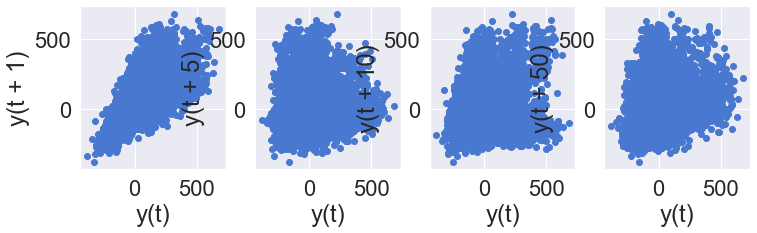

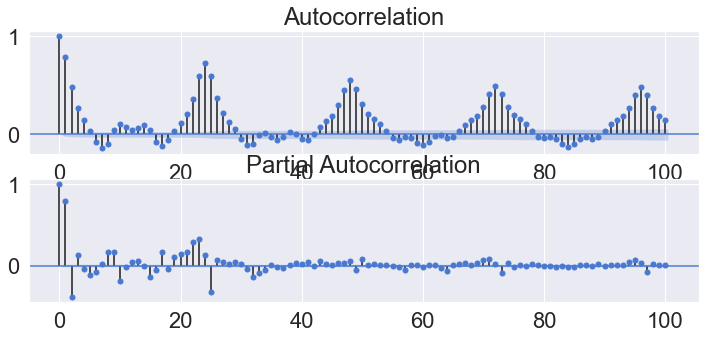

In [5]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_rd = non_feature_engineering(raw_all)

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_rd.columns if x not in Y_colname+X_remove]
X_train_rd, X_test_rd, Y_train_rd, Y_test_rd = datasplit_ts(raw_rd, Y_colname, X_colname, '2012-07-01')

# Applying Base Model
fit_reg1_rd = sm.OLS(Y_train_rd, X_train_rd).fit()
display(fit_reg1_rd.summary())
pred_tr_reg1_rd = fit_reg1_rd.predict(X_train_rd).values
pred_te_reg1_rd = fit_reg1_rd.predict(X_test_rd).values

# Evaluation
Score_reg1_rd, Resid_tr_reg1_rd, Resid_te_reg1_rd = evaluation_trte(Y_train_rd, pred_tr_reg1_rd, 
                                                                Y_test_rd, pred_te_reg1_rd, graph_on=True)
display(Score_reg1_rd)

# Error Analysis
error_analysis(Resid_tr_reg1_rd, ['Error'], X_train_rd, graph_on=True)

## Code Summary (Feature Engineering Data)

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.362e+08
Date:                Sun, 25 Oct 2020   Prob (F-statistic):               0.00
Time:                        20:09:29   Log-Likelihood:                 1906.2
No. Observations:               13128   AIC:                            -3764.
Df Residuals:                   13104   BIC:                            -3585.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
season            -0.0005      0.004     -0.129      0.897      -0.009       0.008
holiday            0.0083      0.014      0.612      0.540      -0.018       0.035
workingday         0.0079      0.007      1.184      0.236      -0.005       0.021
weather            0.0042      0.003      1.232      0.218      -0.003       0.011
temp               0.0022      0.002      1.075      0.282      -0.002       0.006
atemp             -0.0025      0.002     -1.347      0.178      -0.006       0.001
humidity          -0.0001      0.000     -0.845      0.398      -0.000       0.000
windspeed          0.0003      0.000      1.062      0.288      -0.000       0.001
count_trend     9.161e-05   8.57e-05      1.069      0.285   -7.64e-05       0.000
count_seasonal  1.984e-05   2.56e-05      0.775      0.438   -3.03e-05       7e-05
count_Day       4.177e-05   8.36e-05      0.500      0.617      -0.000       0.000
count_Week     -4.345e-05   9.61e-05     -0.452      0.651      -0.000       0.000
count_diff         1.0000    2.9e-05   3.45e+04      0.000       1.000       1.000
Year           -1.547e-05   7.97e-06     -1.939      0.052   -3.11e-05    1.66e-07
Quater_ver2        0.0004      0.002      0.180      0.857      -0.004       0.005
Month              0.0026      0.002      1.051      0.293      -0.002       0.007
Day                0.0004      0.000      1.728      0.084   -4.91e-05       0.001
Hour               0.0006      0.000      1.538      0.124      -0.000       0.001
DayofWeek          0.0003      0.002      0.224      0.823      -0.003       0.003
count_lag1         1.0000    2.7e-05    3.7e+04      0.000       1.000       1.000
count_lag2     -1.926e-05   2.59e-05     -0.744      0.457      -7e-05    3.15e-05
Quater_Dummy_2    -0.0010      0.009     -0.115      0.909      -0.019       0.017
Quater_Dummy_3    -0.0037      0.017     -0.220      0.826      -0.037       0.030
Quater_Dummy_4    -0.0132      0.026     -0.512      0.609      -0.064       0.037
==============================================================================
Omnibus:                    54426.083   Durbin-Watson:                   1.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):      93552024983.815
Skew:                        -114.255   Prob(JB):                         0.00
Kurtosis:                   13078.751   Cond. No.                     3.49e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.49e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.98,0.09,0.01,0.00,0.01,0.03,0.10,0.00
p-value,0.00,0.10,0.00,0.98,1.00,1.00,1.00,0.00
Used Lag,41.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,086.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"-106,845.57",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


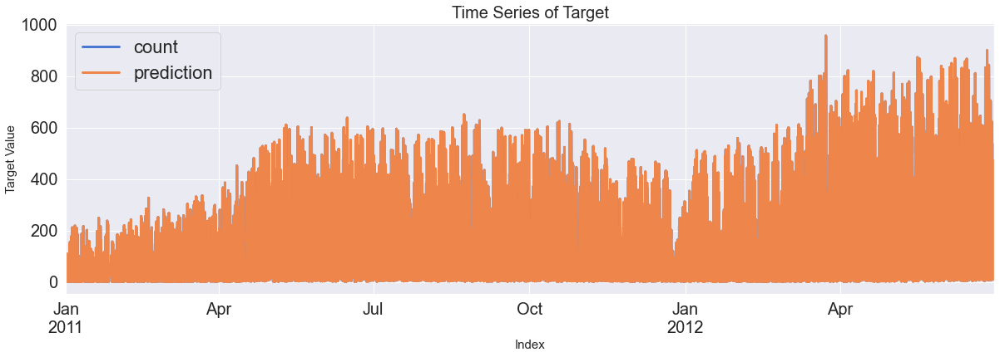

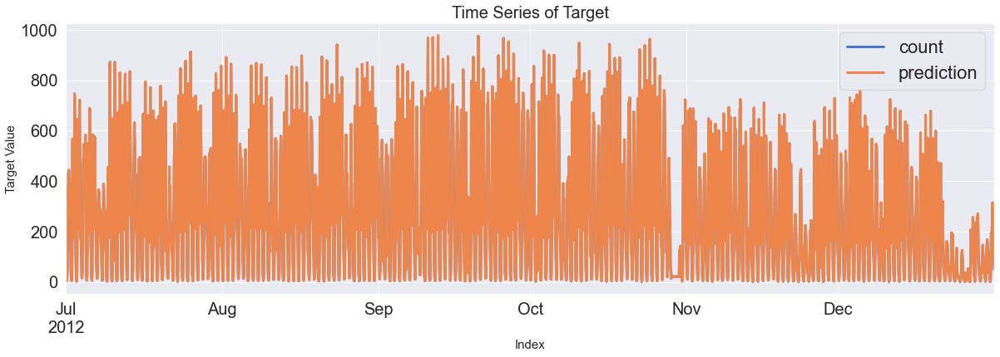

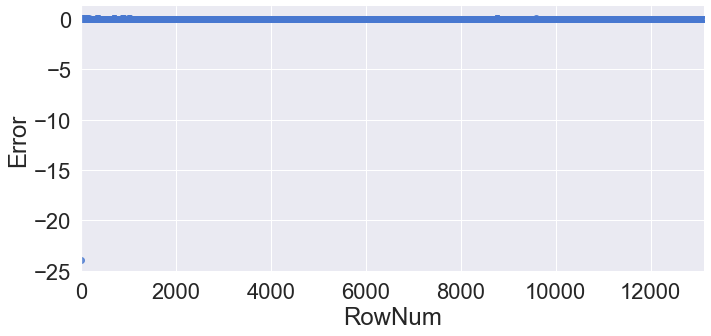

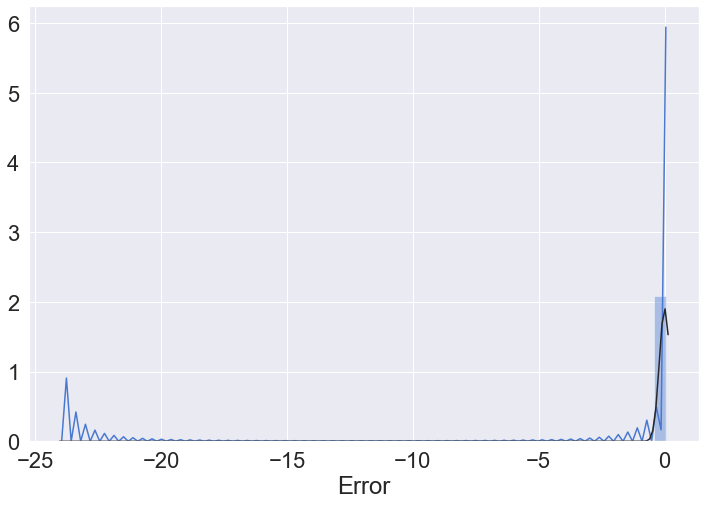

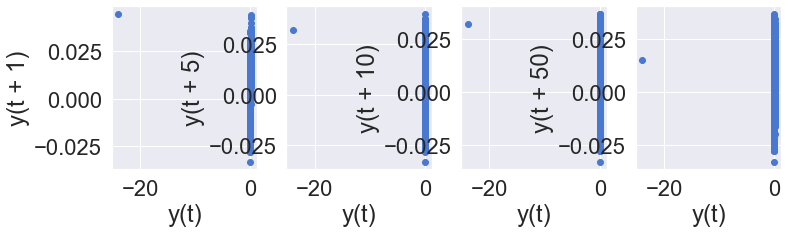

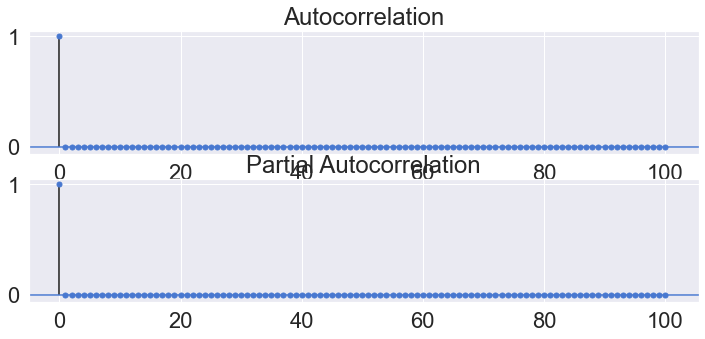

In [6]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_fe, X_test_fe, Y_train_fe, Y_test_fe = datasplit_ts(raw_fe, Y_colname, X_colname, '2012-07-01')

# Applying Base Model
fit_reg1_fe = sm.OLS(Y_train_fe, X_train_fe).fit()
display(fit_reg1_fe.summary())
pred_tr_reg1_fe = fit_reg1_fe.predict(X_train_fe).values
pred_te_reg1_fe = fit_reg1_fe.predict(X_test_fe).values

# Evaluation
Score_reg1_fe, Resid_tr_reg1_fe, Resid_te_reg1_fe = evaluation_trte(Y_train_fe, pred_tr_reg1_fe,
                                                                Y_test_fe, pred_te_reg1_fe, graph_on=True)
display(Score_reg1_fe)

# Error Analysis
error_analysis(Resid_tr_reg1_fe, ['Error'], X_train_fe, graph_on=True)

In [7]:
display(Score_reg1_rd)
display(Score_reg1_fe)

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


## Code Summary (Reality + Scaling + Multicollinearity)

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)
Number_of_Total_X:  24
Number_of_Selected_X:  12


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  count   R-squared (uncentered):                   0.864
Model:                            OLS   Adj. R-squared (uncentered):              0.864
Method:                 Least Squares   F-statistic:                              6925.
Date:                Sun, 25 Oct 2020   Prob (F-statistic):                        0.00
Time:                        20:09:38   Log-Likelihood:                         -77008.
No. Observations:               13128   AIC:                                  1.540e+05
Df Residuals:                   13116   BIC:                                  1.541e+05
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
count_diff      1289.2806     25.881     49.816      0.000    1238.550    1340.011
holiday         7.141e+04   1.01e+04      7.044      0.000    5.15e+04    9.13e+04
count_seasonal  1270.9307     16.107     78.906      0.000    1239.359    1302.503
Day             1151.2606    168.230      6.843      0.000     821.505    1481.017
windspeed       -234.1084    180.733     -1.295      0.195    -588.370     120.154
Quater_ver2     2.865e+04    930.475     30.787      0.000    2.68e+04    3.05e+04
Hour           -3514.0425    282.316    -12.447      0.000   -4067.422   -2960.663
weather        -2.423e+04   2238.550    -10.825      0.000   -2.86e+04   -1.98e+04
Quater_Dummy_2  6.725e+04   3436.993     19.566      0.000    6.05e+04     7.4e+04
DayofWeek       1.621e+04    912.387     17.768      0.000    1.44e+04     1.8e+04
workingday      7.695e+04   4056.717     18.970      0.000     6.9e+04    8.49e+04
count_lag2      1061.0008     14.379     73.788      0.000    1032.816    1089.186
==============================================================================
Omnibus:                     1665.324   Durbin-Watson:                   0.829
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5853.426
Skew:                           0.626   Prob(JB):                         0.00
Kurtosis:                       6.022   Cond. No.                     1.53e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.53e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,MAE,MSE,MAPE
Train,60.84,"7,288.40",202.42
Test,99.87,"19,151.40",153.34


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-10.30,2.20,0.95,"4,492.76","4,708.56","7,076.59","16,328.78",2.71
p-value,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,41.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,086.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"140,733.05",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


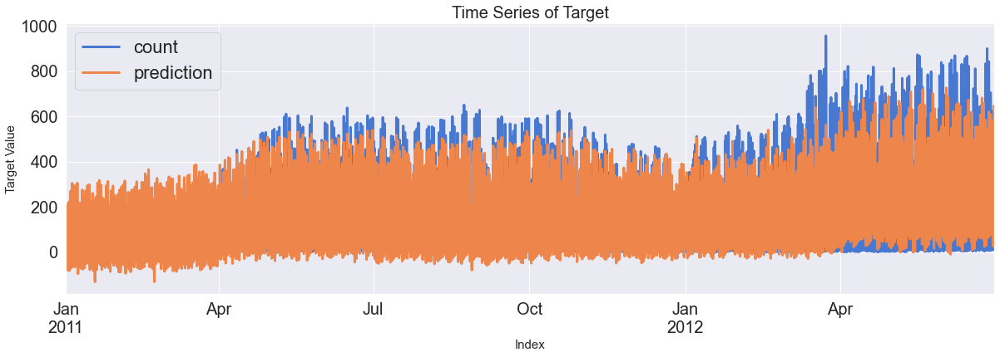

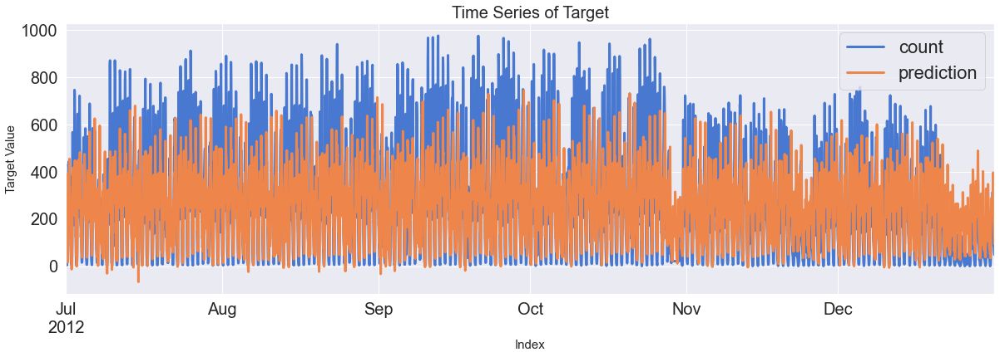

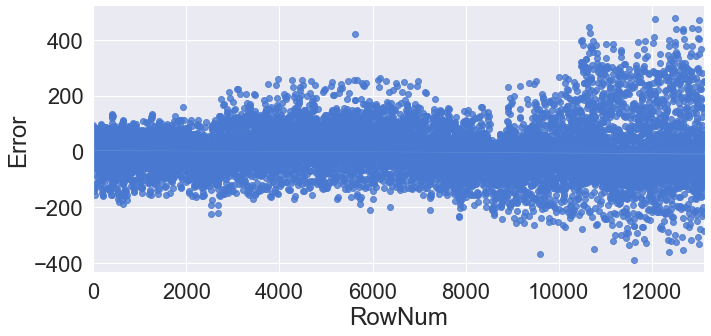

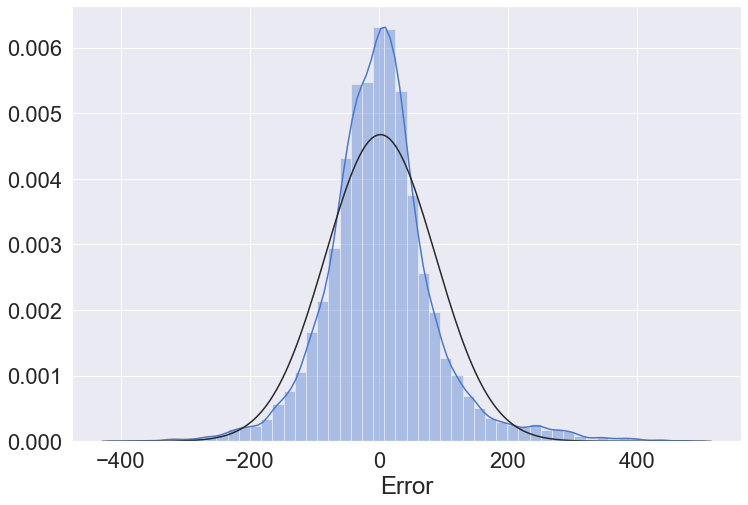

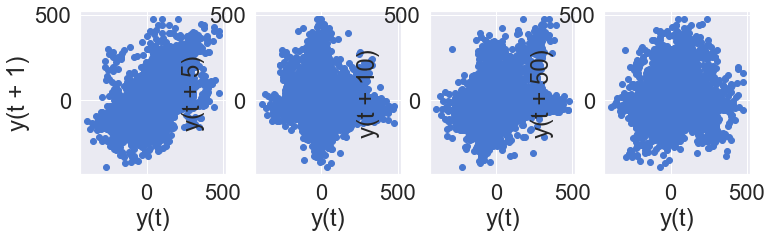

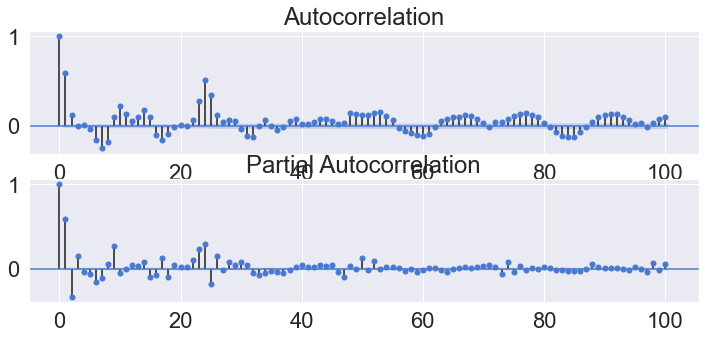

In [8]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)
### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############
### Scaling ###
X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
###############
### Multicollinearity ###
print('Number_of_Total_X: ', len(X_train_feRS.columns))
X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 12)
print('Number_of_Selected_X: ', len(X_colname_vif))
X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
#########################

# Applying Base Model
fit_reg1_feRSM = sm.OLS(Y_train_feR, X_train_feRSM).fit()
display(fit_reg1_feRSM.summary())
pred_tr_reg1_feRSM = fit_reg1_feRSM.predict(X_train_feRSM).values
pred_te_reg1_feRSM = fit_reg1_feRSM.predict(X_test_feRSM).values

# Evaluation
Score_reg1_feRSM, Resid_tr_reg1_feRSM, Resid_te_reg1_feRSM = evaluation_trte(Y_train_feR, pred_tr_reg1_feRSM,
                                                                   Y_test_feR, pred_te_reg1_feRSM, graph_on=True)
display(Score_reg1_feRSM)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM, ['Error'], X_train_feRSM, graph_on=True)

## Code Summary (Random Forest)

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)
Number_of_Total_X:  24
Number_of_Selected_X:  12


,MAE,MSE,MAPE
Train,6.54,123.38,9.11
Test,51.52,"6,749.92",40.49


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-16.29,0.40,0.83,986.72,"1,017.92","1,064.70","1,511.67",3.04
p-value,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,27.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,100.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"98,935.70",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


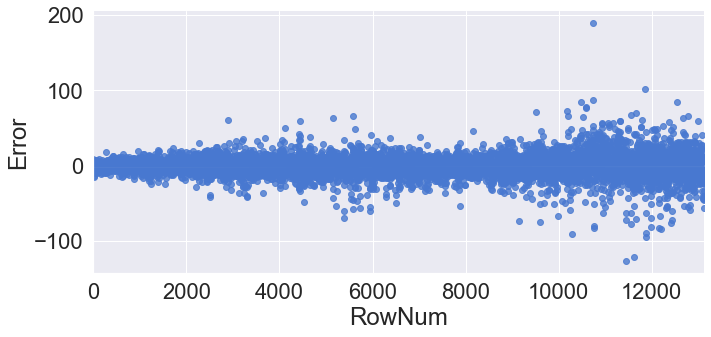

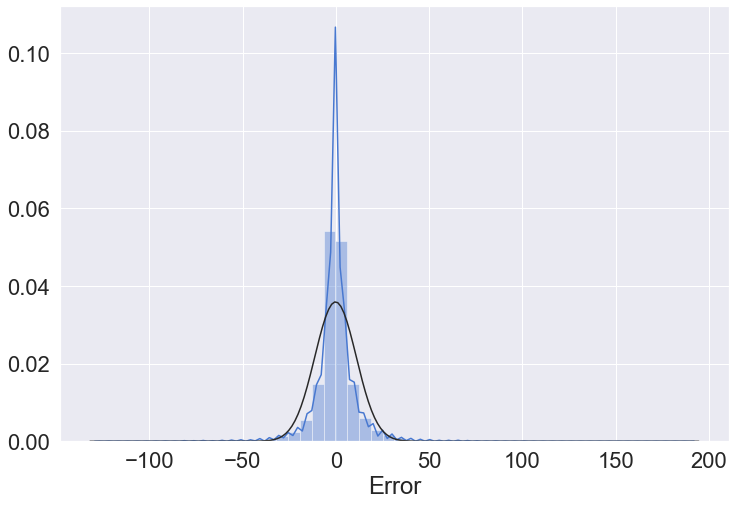

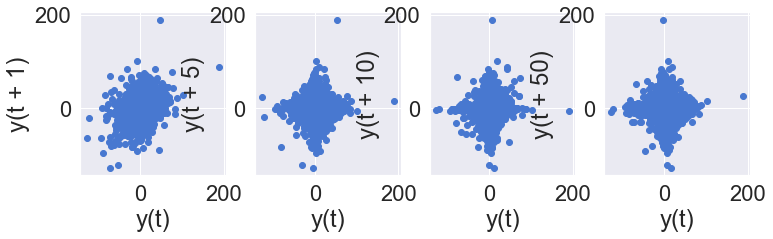

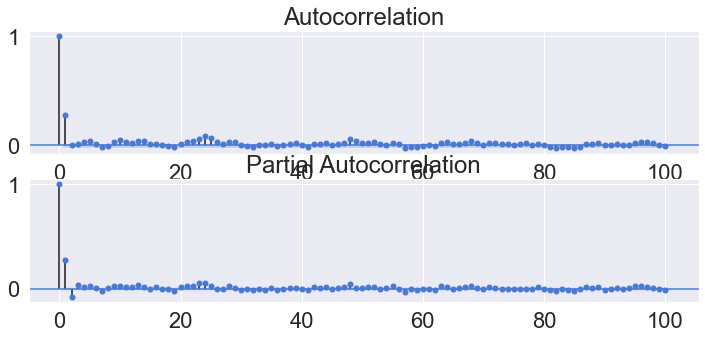

In [9]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)
### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############
### Scaling ###
X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
###############
### Multicollinearity ###
print('Number_of_Total_X: ', len(X_train_feRS.columns))
X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 12)
print('Number_of_Selected_X: ', len(X_colname_vif))
X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
#########################

# RandomForestRegressor
fit_reg6 = RandomForestRegressor(n_estimators=100, random_state=123).fit(X_train_feRSM, Y_train_feR)
pred_tr_reg6_feRSM = fit_reg6.predict(X_train_feRSM)
pred_te_reg6_feRSM = fit_reg6.predict(X_test_feRSM)

# Evaluation
Score_reg6_feRSM, Resid_tr_reg6_feRSM, Resid_te_reg6_feRSM = evaluation_trte(Y_train_feR, pred_tr_reg6_feRSM,
                                                                   Y_test_feR, pred_te_reg6_feRSM, graph_on=False)
display(Score_reg6_feRSM)

# Error Analysis
error_analysis(Resid_tr_reg6_feRSM, ['Error'], X_train_feRSM, graph_on=True)

# TS분석

## Code Summary (Customized Auto SARIMAX)

In [10]:
# # Data Loading
# # location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
# location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
# raw_all = pd.read_csv(location)

# # Feature Engineering
# raw_fe = feature_engineering(raw_all)
# ### Reality ###
# target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
# raw_feR = feature_engineering_year_duplicated(raw_fe, target)
# ###############

# # Data Split
# # Confirm of input and output
# Y_colname = ['count']
# X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
# X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
# X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
# ### Reality ###
# target = ['count_lag1', 'count_lag2']
# X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
# ###############
# ### Scaling ###
# X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
# ###############
# ### Multicollinearity ###
# print('Number_of_Total_X: ', len(X_train_feRS.columns))
# X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 12)
# print('Number_of_Selected_X: ', len(X_colname_vif))
# X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
# #########################

# # 모델링
# ## Additional Features
# exog_tr = X_train_feRSM[['count_seasonal', 'weather', 'count_lag2', 'count_diff', 'Quater_ver2', 'Hour', 'workingday', 'DayofWeek']]
# exog_te = X_test_feRSM[['count_seasonal', 'weather', 'count_lag2', 'count_diff', 'Quater_ver2', 'Hour', 'workingday', 'DayofWeek']]                             
# ## Parameter Setting
# p, q = range(1,3), range(1,3)
# d = range(0,1)
# P, Q = range(1,3), range(1,3)
# D = range(1,2)
# m = 12
# trend_pdq = list(product(p, d, q))
# seasonal_pdq = [(candi[0], candi[1], candi[2], m) for candi in list(product(P, D, Q))]
# ## SARIMAX
# AIC = []
# SARIMAX_order = []
# for trend_param in tqdm(trend_pdq):
#     for seasonal_params in seasonal_pdq:
#         try:
#             result =sm.tsa.SARIMAX(Y_train_feR, trend='c', 
#                                    order=trend_param, seasonal_order=seasonal_params, exog=exog_tr).fit()
#             print('Fit SARIMAX: trend_order={} seasonal_order={} AIC={}, BIC={}'.format(trend_param, seasonal_params, result.aic, result.bic, end='\r'))
#             AIC.append(result.aic)
#             SARIMAX_order.append([trend_param, seasonal_params])
#         except:
#             continue
# ## Parameter Selection
# print('The smallest AIC is {} for model SARIMAX{}x{}'.format(min(AIC), SARIMAX_order[AIC.index(min(AIC))][0],
#                                                              SARIMAX_order[AIC.index(min(AIC))][1]))
# ## Auto-SARIMAX Fitting
# fit_ts_sarimax = sm.tsa.SARIMAX(Y_train_feR, trend='c', order=SARIMAX_order[AIC.index(min(AIC))][0], 
#                                 seasonal_order=SARIMAX_order[AIC.index(min(AIC))][1], exog=exog_tr).fit()
# display(fit_ts_sarimax.summary())
# pred_tr_ts_sarimax = fit_ts_sarimax.predict()
# pred_te_ts_sarimax = fit_ts_sarimax.get_forecast(len(Y_test_feR), exog=exog_te).predicted_mean
# pred_te_ts_sarimax_ci = fit_ts_sarimax.get_forecast(len(Y_test_feR), exog=exog_te).conf_int()
    
# # 검증
# Score_ts_sarimax, Resid_tr_ts_sarimax, Resid_te_ts_sarimax = evaluation_trte(Y_train_feR, pred_tr_ts_sarimax, 
#                                                                              Y_test_feR, pred_te_ts_sarimax, graph_on=True)
# display(Score_ts_sarimax)
# ax = pd.DataFrame(Y_test_feR).plot(figsize=(12,4))
# pd.DataFrame(pred_te_ts_sarimax, index=Y_test_feR.index, columns=['prediction']).plot(kind='line',
#                                                                            xlim=(Y_test_feR.index.min(),Y_test_feR.index.max()),
#                                                                            linewidth=3, fontsize=20, ax=ax)
# ax.fill_between(pd.DataFrame(pred_te_ts_sarimax_ci, index=Y_test_feR.index).index,
#                 pd.DataFrame(pred_te_ts_sarimax_ci, index=Y_test_feR.index).iloc[:,0],
#                 pd.DataFrame(pred_te_ts_sarimax_ci, index=Y_test_feR.index).iloc[:,1], color='k', alpha=0.15)
# plt.show()

# # 잔차진단
# error_analysis(Resid_tr_ts_sarimax, ['Error'], Y_train_feR, graph_on=True)

## Code Summary (Auto-ARIMA Library)

In [11]:
# import pmdarima as pm
# from pmdarima import model_selection

# # Data Loading and Split
# data = pm.datasets.load_wineind()
# train, test = model_selection.train_test_split(data, train_size=150)

# # 모델링
# autoarima = pm.auto_arima(train,  
#                           stationary=False,
#                           with_intercept=True,
# #                           start_p=0, d=None, start_q=0,
# #                           max_p=5, max_d=1, max_q=5,
#                           seasonal=True, m=12,
# #                           start_P=0, D=None, start_Q=0,
# #                           max_P=5, max_D=1, max_Q=5,
#                           max_order=30, maxiter=5,
#                           information_criterion='bic',
#                           trace=True, suppress_warnings=True)
# display(autoarima.summary())
# pred_tr_ts_autoarima = autoarima.predict_in_sample()
# pred_tr_ts_autoarima = autoarima.predict(n_periods=len(train))
# pred_te_ts_autoarima = autoarima.predict(n_periods=len(test), 
#                                          return_conf_int=True)[0]
# pred_te_ts_autoarima_ci = autoarima.predict(n_periods=len(test), 
#                                             return_conf_int=True)[1]

# # 검증
# Score_ts_autoarima, Resid_tr_ts_autoarima, Resid_te_ts_autoarima = evaluation_trte(pd.DataFrame(train), pred_tr_ts_autoarima, 
#                                                                                    pd.DataFrame(test), pred_te_ts_autoarima, graph_on=True)
# display(Score_ts_autoarima)
# ax = pd.DataFrame(test).plot(figsize=(12,4))
# pd.DataFrame(pred_te_ts_autoarima, columns=['prediction']).plot(kind='line',
#                                                                 linewidth=3, fontsize=20, ax=ax)
# ax.fill_between(pd.DataFrame(pred_te_ts_autoarima_ci).index,
#                 pd.DataFrame(pred_te_ts_autoarima_ci).iloc[:,0],
#                 pd.DataFrame(pred_te_ts_autoarima_ci).iloc[:,1], color='k', alpha=0.15)
# plt.show()

# # 잔차진단
# error_analysis(Resid_tr_ts_autoarima, ['Error'], pd.DataFrame(train), graph_on=True)

In [12]:
# import pmdarima as pm

# # Data Loading
# # location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
# location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
# raw_all = pd.read_csv(location)

# # Feature Engineering
# raw_fe = feature_engineering(raw_all)
# ### Reality ###
# target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
# raw_feR = feature_engineering_year_duplicated(raw_fe, target)
# ###############

# # Data Split
# # Confirm of input and output
# Y_colname = ['count']
# X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
# X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
# X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
# ### Reality ###
# target = ['count_lag1', 'count_lag2']
# X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
# ###############
# ### Scaling ###
# X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
# ###############
# ### Multicollinearity ###
# print('Number_of_Total_X: ', len(X_train_feRS.columns))
# X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 12)
# print('Number_of_Selected_X: ', len(X_colname_vif))
# X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
# #########################

# # 모델링
# ## Parameter Setting
# trend_diff_order = 0
# seasonal_diff_order, seasonal_order = 0, 24
# ## SARIMAX
# fit_ts_autoarima = pm.auto_arima(Y_train_feR, 
#                                  stationary=False,
#                                  with_intercept=True,
#                                  start_p=0, d=None, start_q=0,
#                                  max_p=2, max_d=1, max_q=2,
#                                  seasonal=True, m=24,
#                                  start_P=0, D=None, start_Q=0,
#                                  max_P=2, max_D=1, max_Q=2,
#                                  max_order=30, maxiter=3,
#                                  stepwise=False,
#                                  exogenous=X_train_feRSM,
#                                  information_criterion='aic',
#                                  trace=True, suppress_warnings=True)
# display(fit_ts_autoarima.summary())
# pred_tr_ts_autoarima = fit_ts_autoarima.predict_in_sample(exogenous=X_train_feRSM)
# pred_tr_ts_autoarima = fit_ts_autoarima.predict(n_periods=len(Y_train_feR), exogenous=X_train_feRSM)
# pred_te_ts_autoarima = fit_ts_autoarima.predict(n_periods=len(Y_test_feR), 
#                                                 exogenous=X_test_feRSM, 
#                                                 return_conf_int=True)[0]
# pred_te_ts_autoarima_ci = fit_ts_autoarima.predict(n_periods=len(Y_test_feR), 
#                                                    exogenous=X_test_feRSM, 
#                                                    return_conf_int=True)[1]

# # 검증
# Score_ts_autoarima, Resid_tr_ts_autoarima, Resid_te_ts_autoarima = evaluation_trte(Y_train_feR, pred_tr_ts_autoarima, 
#                                                                                    Y_test_feR, pred_te_ts_autoarima, graph_on=True)
# display(Score_ts_autoarima)
# ax = pd.DataFrame(Y_test_feR).plot(figsize=(12,4))
# pd.DataFrame(pred_te_ts_autoarima, 
#              index=Y_test_feR.index, columns=['prediction']).plot(kind='line',
#                                                                   xlim=(Y_test_feR.index.min(),Y_test_feR.index.max()),
#                                                                   linewidth=3, fontsize=20, ax=ax)
# ax.fill_between(pd.DataFrame(pred_te_ts_autoarima_ci, index=Y_test_feR.index).index,
#                 pd.DataFrame(pred_te_ts_autoarima_ci, index=Y_test_feR.index).iloc[:,0],
#                 pd.DataFrame(pred_te_ts_autoarima_ci, index=Y_test_feR.index).iloc[:,1], color='k', alpha=0.15)
# plt.show()

# # 잔차진단
# error_analysis(Resid_tr_ts_autoarima, ['Error'], Y_train_feR, graph_on=True)

# TS분석: Prophet Library

In [13]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)
### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############
### Scaling ###
X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
###############
### Multicollinearity ###
print('Number_of_Total_X: ', len(X_train_feRS.columns))
X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 12)
print('Number_of_Selected_X: ', len(X_colname_vif))
X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
#########################

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)
Number_of_Total_X:  24
Number_of_Selected_X:  12


## Default

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-54.49,-183.63,68.48
1,2011-01-01 01:00:00,-68.62,-199.10,59.92
2,2011-01-01 02:00:00,-104.43,-233.64,18.20
3,2011-01-01 03:00:00,-138.99,-272.05,-11.84
4,2011-01-01 04:00:00,-138.31,-262.15,-19.69
...,...,...,...,...
17539,2012-12-31 19:00:00,578.47,384.67,765.75
17540,2012-12-31 20:00:00,495.84,313.60,690.70
17541,2012-12-31 21:00:00,408.62,224.10,593.41
17542,2012-12-31 22:00:00,352.54,159.76,550.49


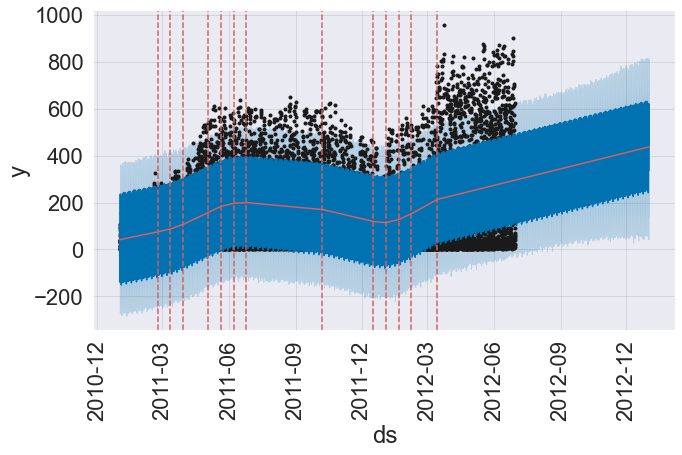

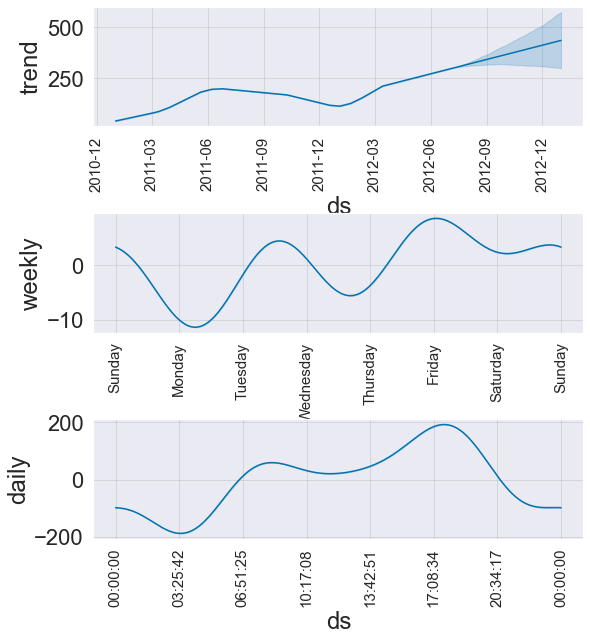

,MAE,MSE,MAPE
Train,74.42,"10,203.82",314.01
Test,176.71,"42,581.35",616.07


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1687: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1687: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


Time:  43.053856313999994


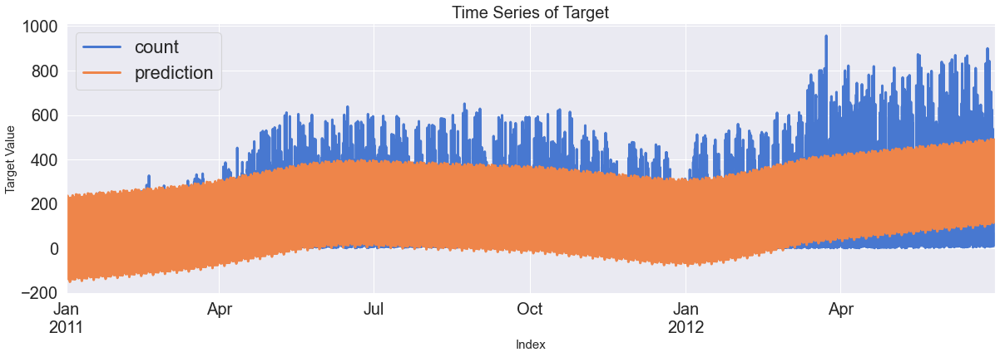

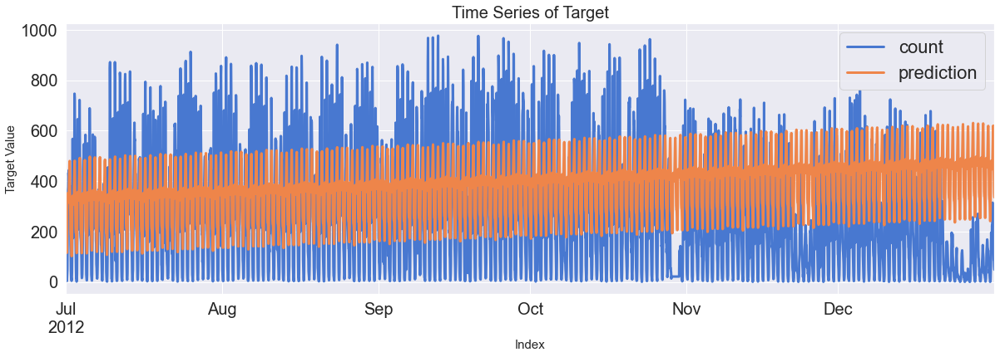

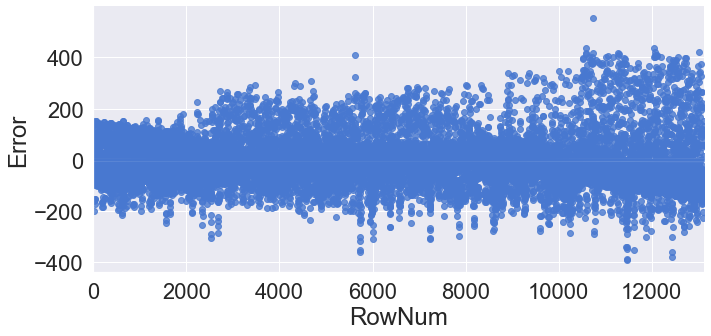

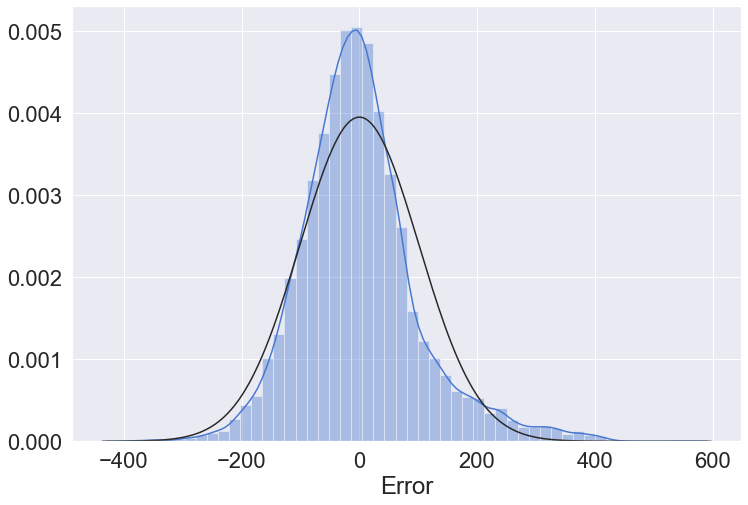

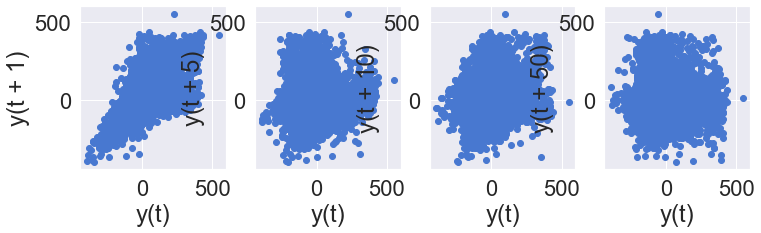

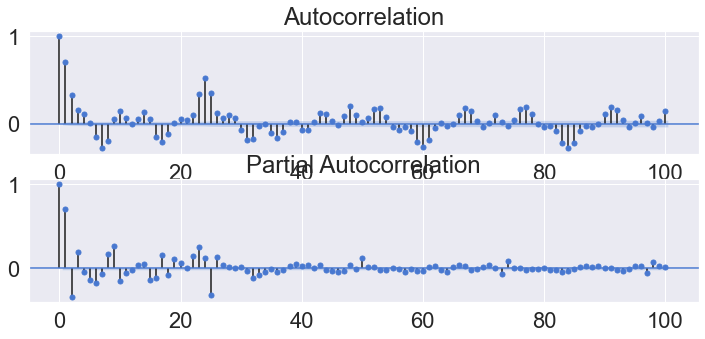

In [14]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
fit_reg1_feRSM_prophet = Prophet(growth='linear',
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.8, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.05, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=10.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Saturating(growth)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-53.67,-182.14,79.72
1,2011-01-01 01:00:00,-67.82,-206.39,63.27
2,2011-01-01 02:00:00,-103.65,-239.21,25.56
3,2011-01-01 03:00:00,-138.22,-265.53,-0.85
4,2011-01-01 04:00:00,-137.56,-258.28,-3.18
...,...,...,...,...
17539,2012-12-31 19:00:00,569.73,418.24,709.73
17540,2012-12-31 20:00:00,487.12,341.04,633.41
17541,2012-12-31 21:00:00,399.90,240.76,533.19
17542,2012-12-31 22:00:00,343.83,190.74,479.37


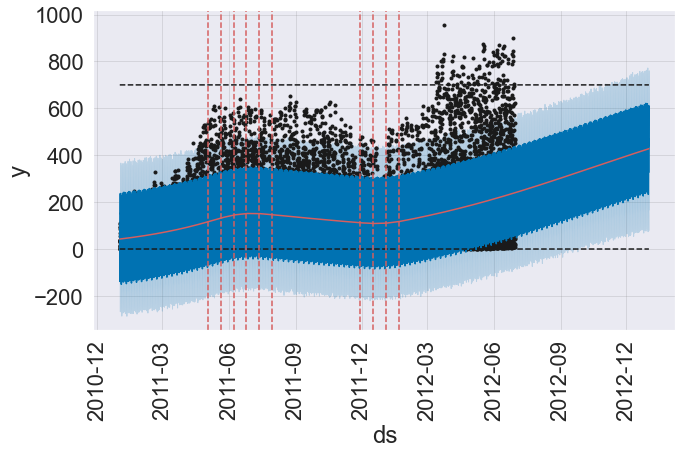

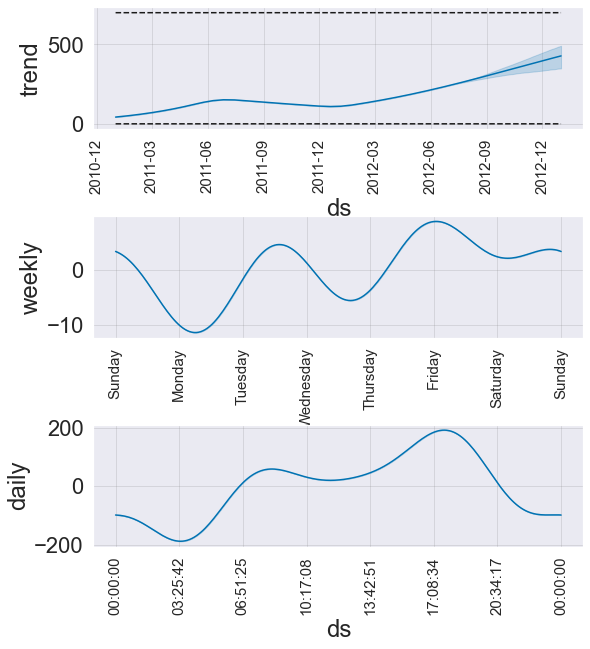

,MAE,MSE,MAPE
Train,77.84,"11,955.30",325.51
Test,162.01,"38,664.53",538.29


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  48.92043678


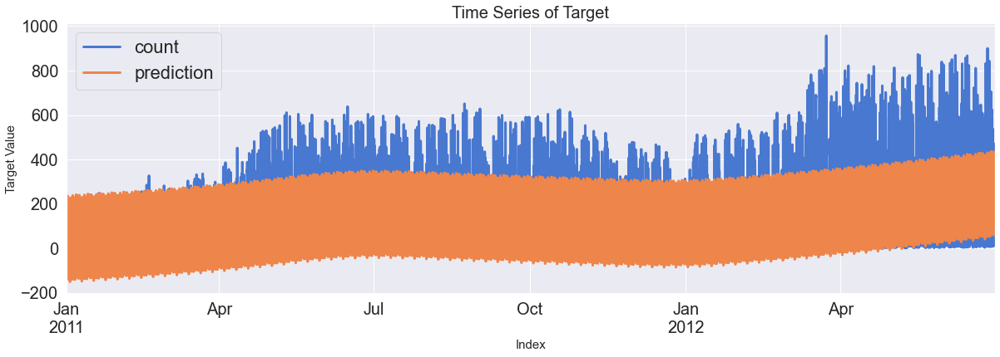

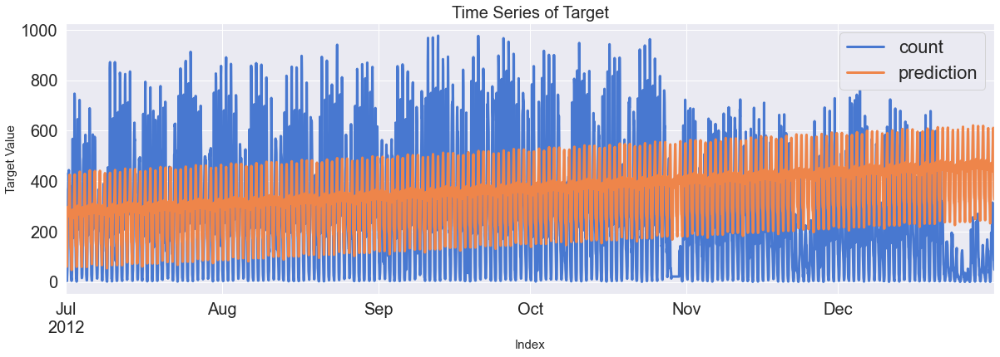

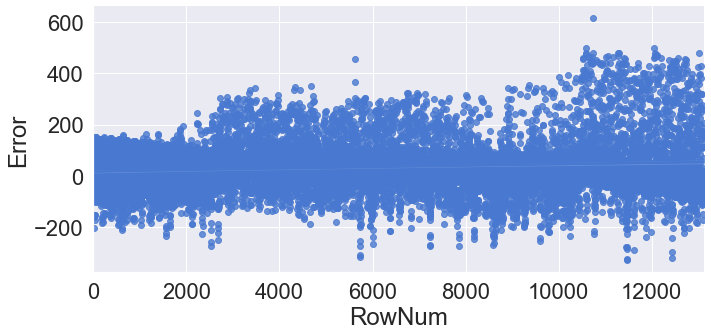

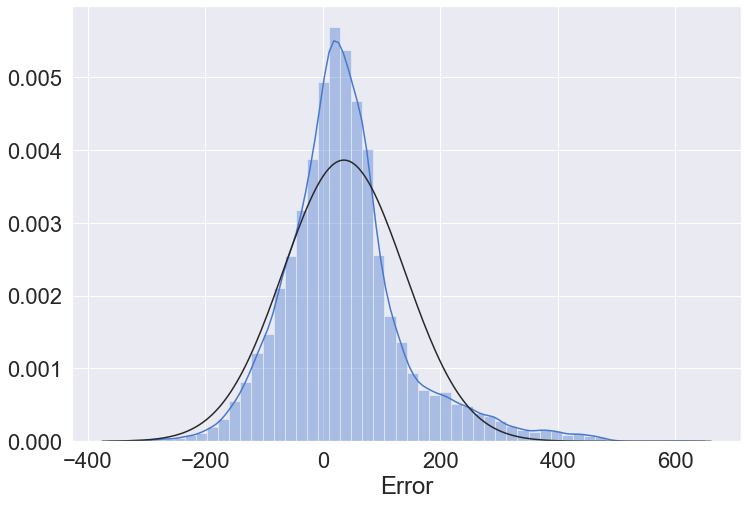

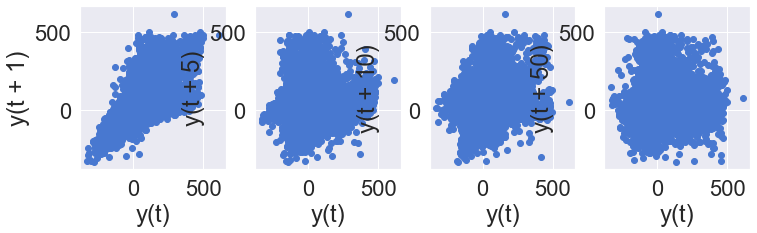

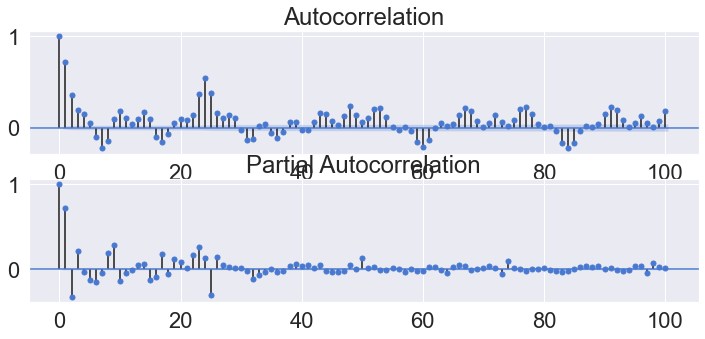

In [15]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.8, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.05, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=10.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Trend(changepoint_range)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-53.71,-186.88,73.89
1,2011-01-01 01:00:00,-67.85,-191.80,57.95
2,2011-01-01 02:00:00,-103.68,-227.24,34.98
3,2011-01-01 03:00:00,-138.26,-267.77,-4.98
4,2011-01-01 04:00:00,-137.59,-272.20,-5.51
...,...,...,...,...
17539,2012-12-31 19:00:00,569.38,416.67,723.81
17540,2012-12-31 20:00:00,486.77,337.72,634.79
17541,2012-12-31 21:00:00,399.55,255.43,546.06
17542,2012-12-31 22:00:00,343.48,191.44,492.41


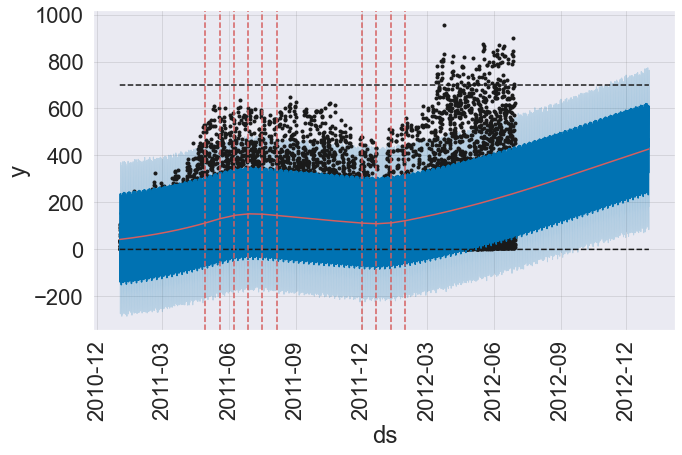

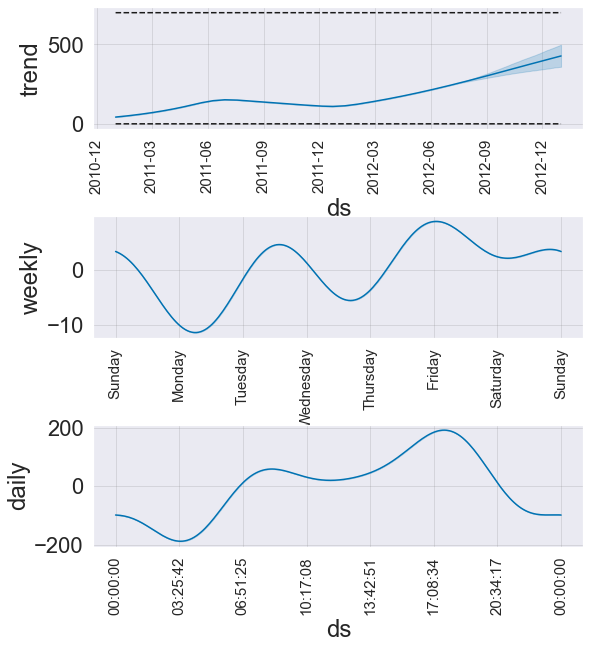

,MAE,MSE,MAPE
Train,77.84,"11,960.55",325.44
Test,161.86,"38,610.25",537.48


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  44.817974374000016


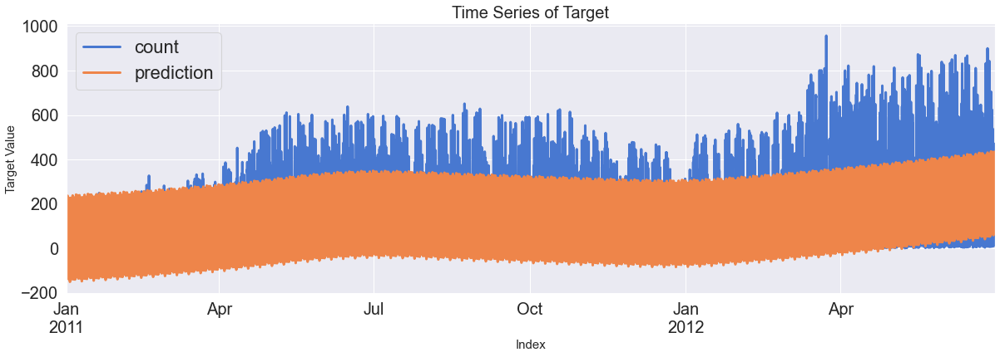

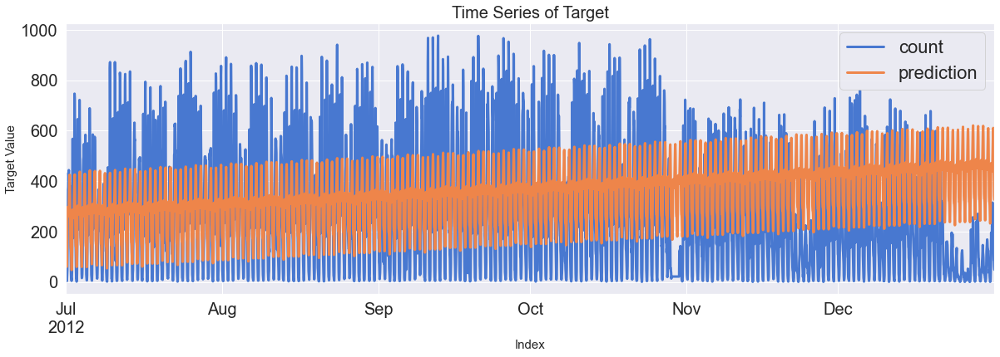

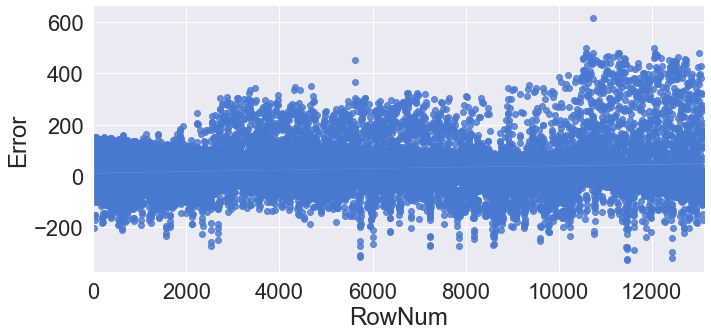

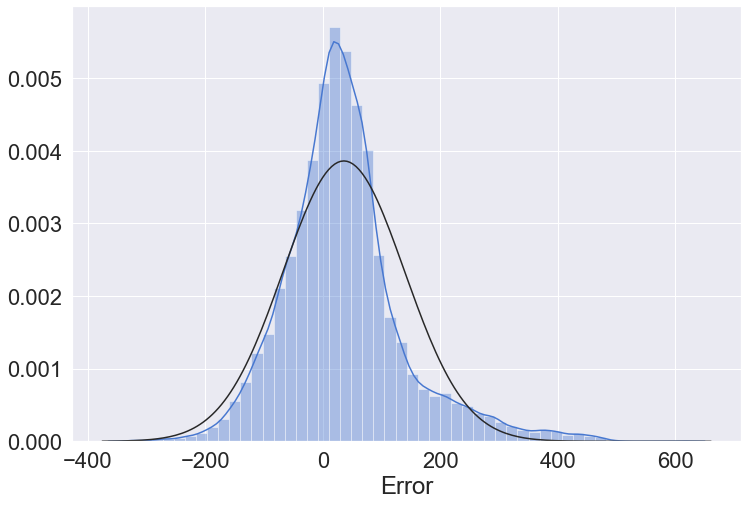

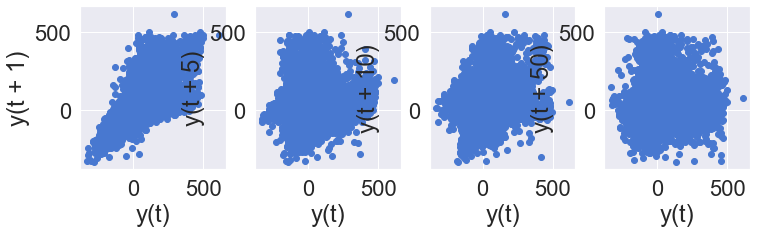

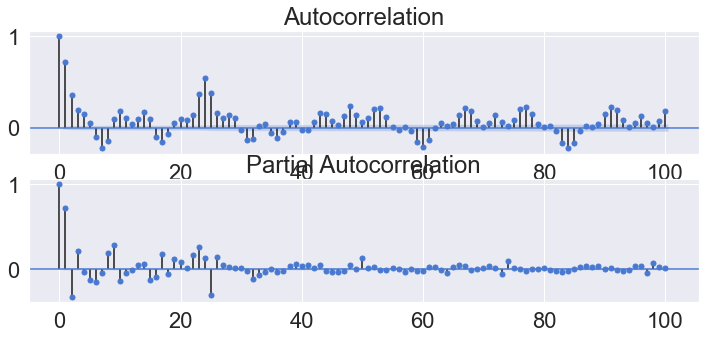

In [16]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.05, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=10.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Trend(changepoint_prior_scale)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-61.86,-191.11,67.17
1,2011-01-01 01:00:00,-76.01,-207.67,42.54
2,2011-01-01 02:00:00,-111.83,-239.30,8.61
3,2011-01-01 03:00:00,-146.40,-284.31,-18.24
4,2011-01-01 04:00:00,-145.73,-269.16,-24.95
...,...,...,...,...
17539,2012-12-31 19:00:00,451.73,251.48,670.96
17540,2012-12-31 20:00:00,369.10,174.98,575.07
17541,2012-12-31 21:00:00,281.87,77.36,504.73
17542,2012-12-31 22:00:00,225.78,24.81,432.49


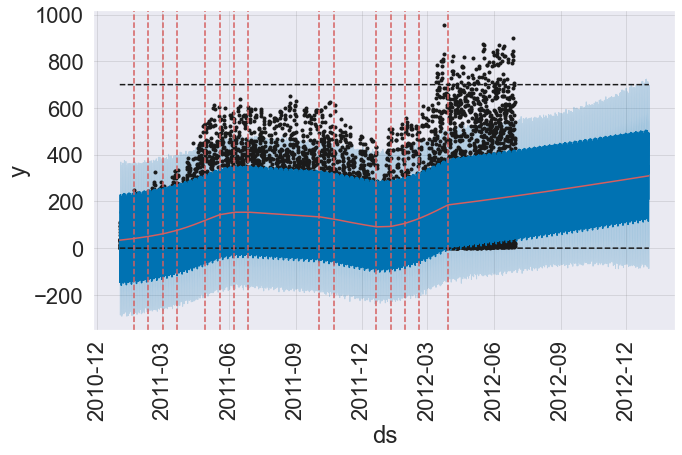

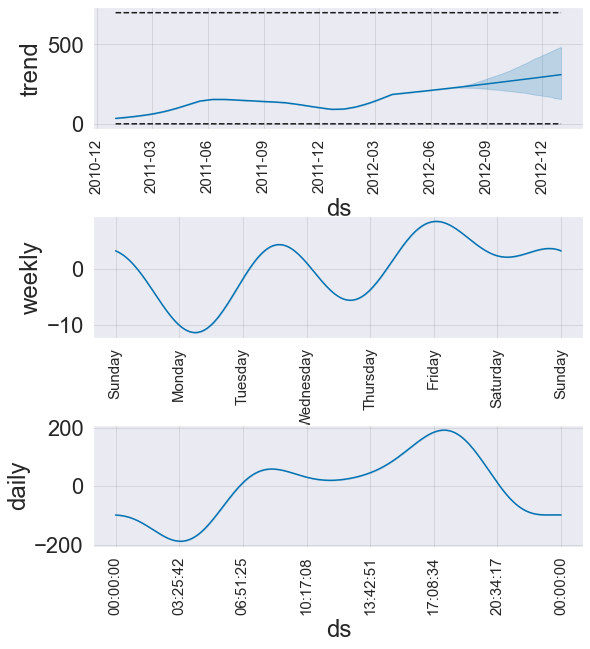

,MAE,MSE,MAPE
Train,77.45,"11,736.85",343.25
Test,127.32,"27,473.29",325.67


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  112.42903209000002


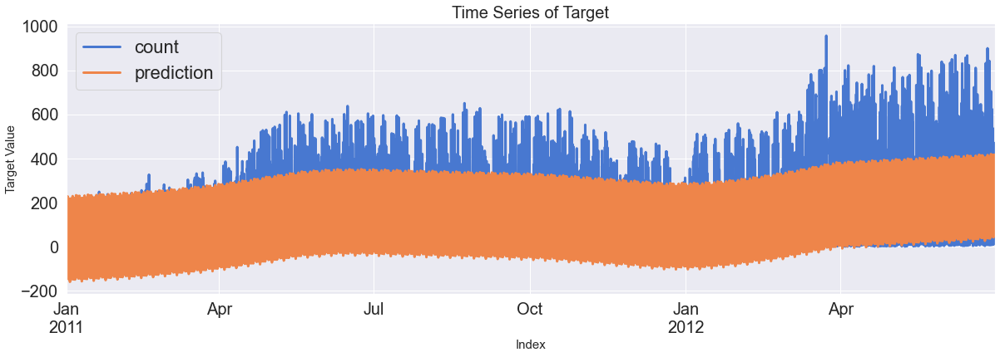

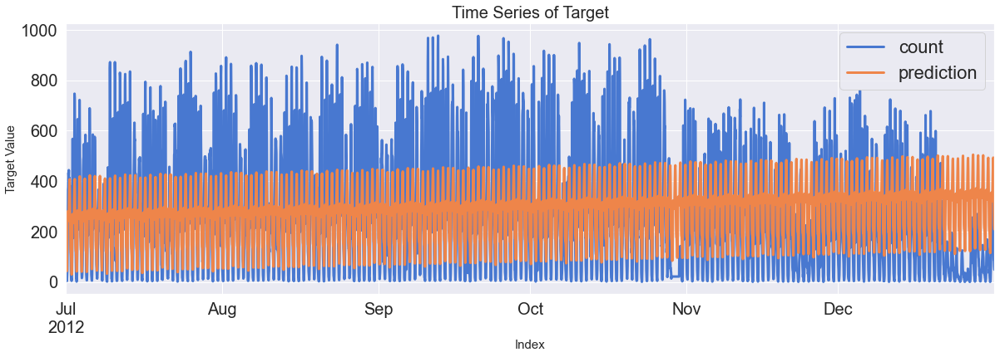

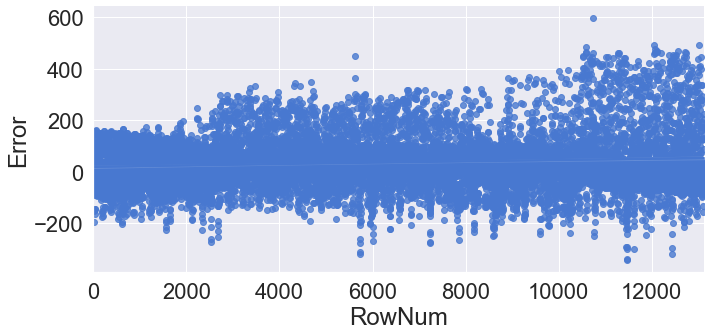

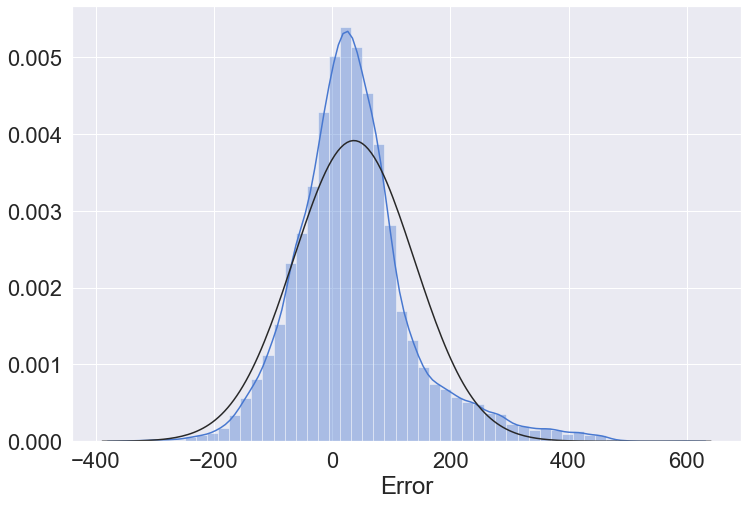

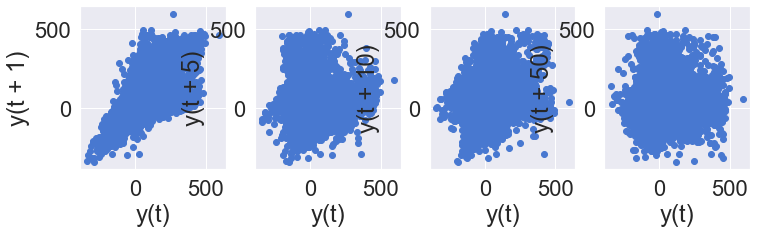

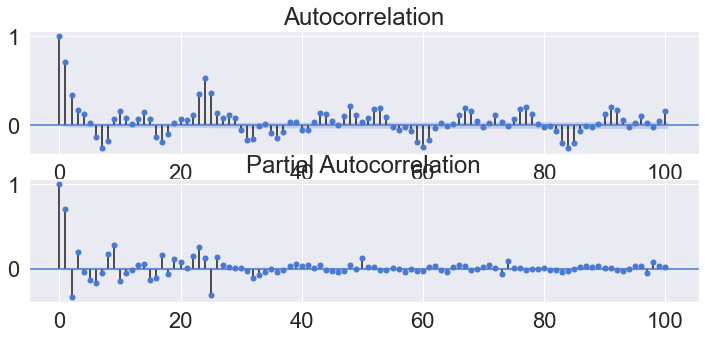

In [17]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=10.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Seasonality(yearly_seasonality)

,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-78.57,-214.12,52.78
1,2011-01-01 01:00:00,-92.73,-214.39,36.49
2,2011-01-01 02:00:00,-128.56,-261.41,-4.53
3,2011-01-01 03:00:00,-163.14,-293.33,-40.90
4,2011-01-01 04:00:00,-162.48,-296.43,-32.85
...,...,...,...,...
17539,2012-12-31 19:00:00,173.60,41.44,305.23
17540,2012-12-31 20:00:00,90.94,-41.42,221.27
17541,2012-12-31 21:00:00,3.68,-133.49,136.83
17542,2012-12-31 22:00:00,-52.44,-183.68,80.50


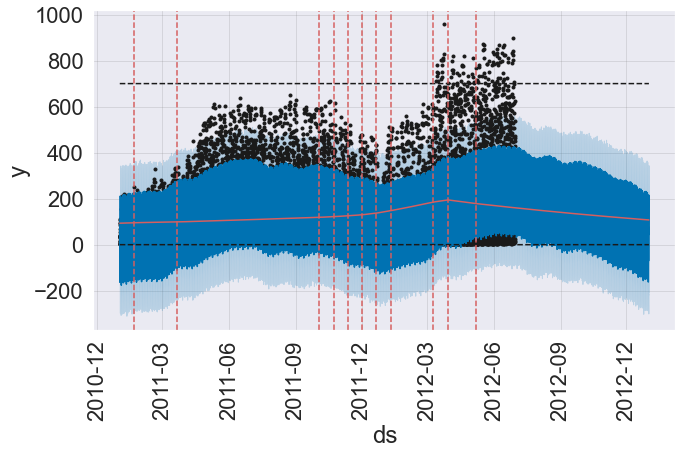

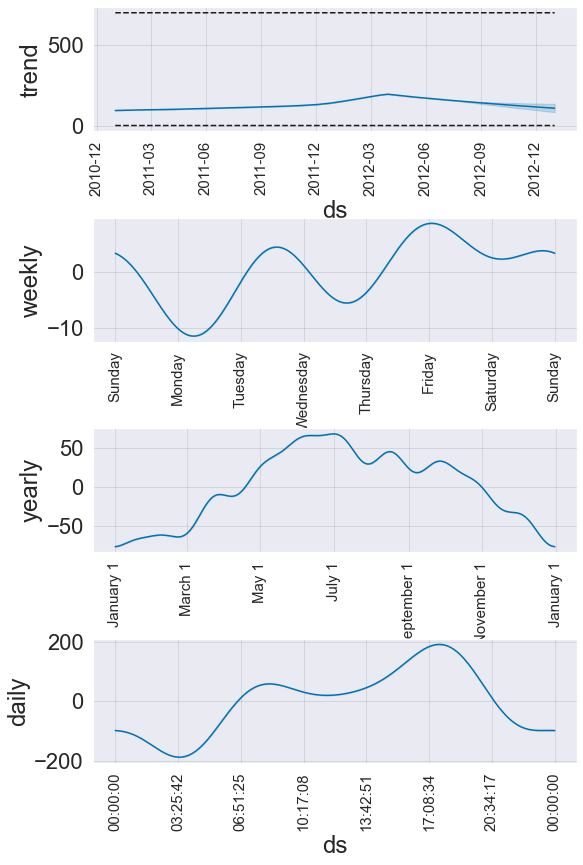

,MAE,MSE,MAPE
Train,78.03,"11,640.79",374.76
Test,133.61,"35,069.19",193.69


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  116.76219156899998


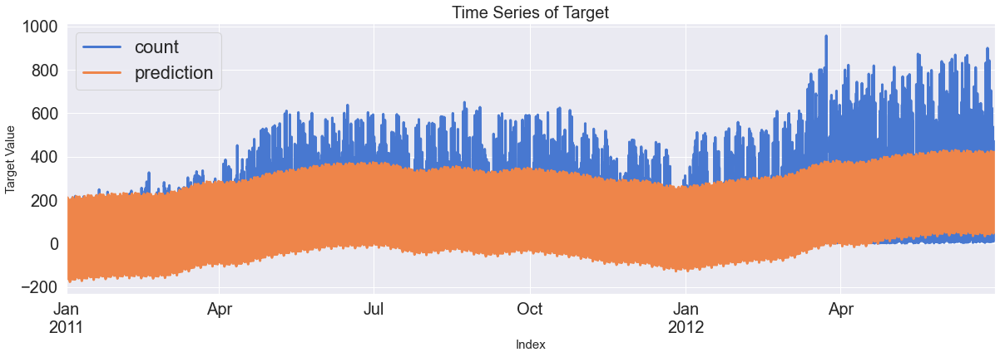

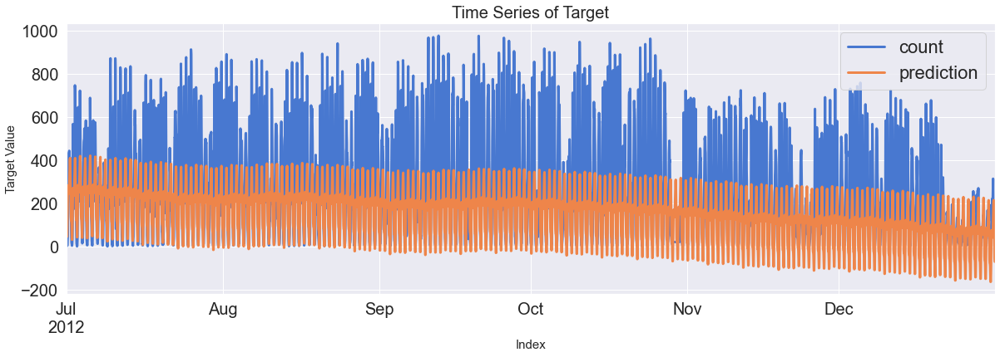

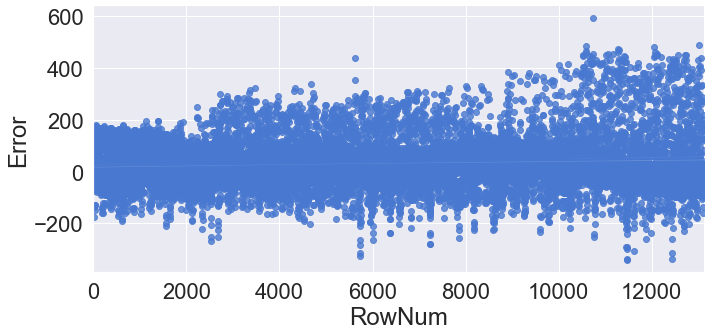

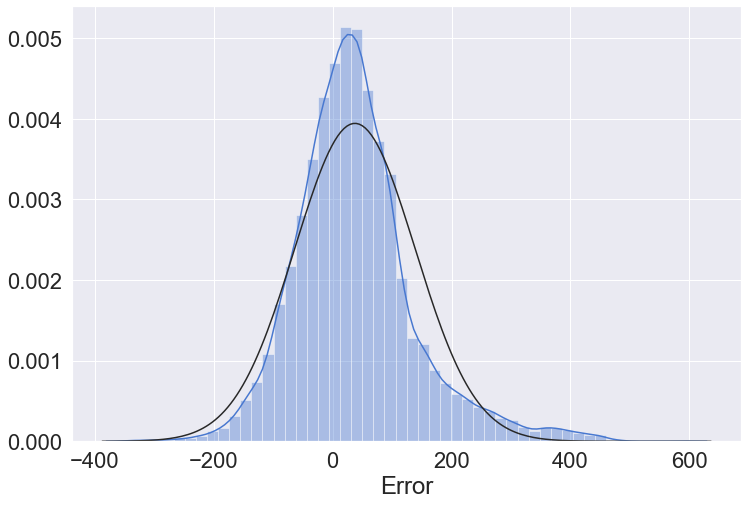

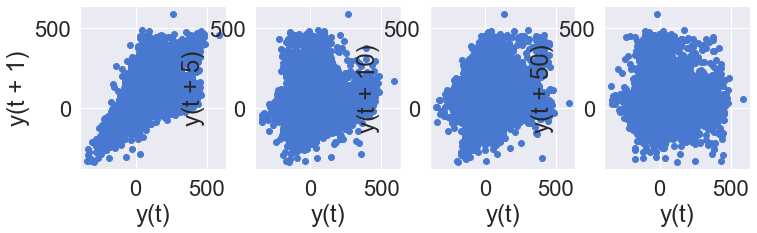

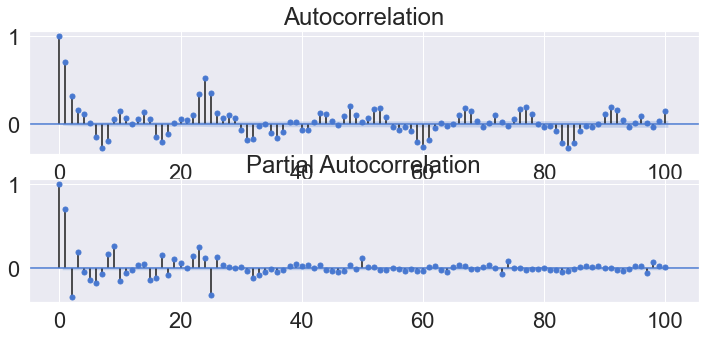

In [18]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=10.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality=True, # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Seasonality(seasonality_prior_scale)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-61.66,-186.11,59.28
1,2011-01-01 01:00:00,-75.81,-203.75,50.89
2,2011-01-01 02:00:00,-111.63,-242.32,16.19
3,2011-01-01 03:00:00,-146.21,-276.05,-18.34
4,2011-01-01 04:00:00,-145.54,-264.75,-14.86
...,...,...,...,...
17539,2012-12-31 19:00:00,451.35,252.32,682.91
17540,2012-12-31 20:00:00,368.72,164.76,595.67
17541,2012-12-31 21:00:00,281.48,76.96,510.98
17542,2012-12-31 22:00:00,225.39,24.62,444.67


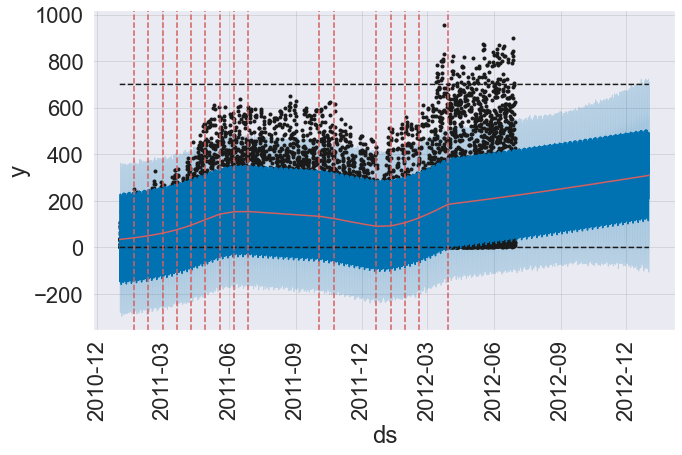

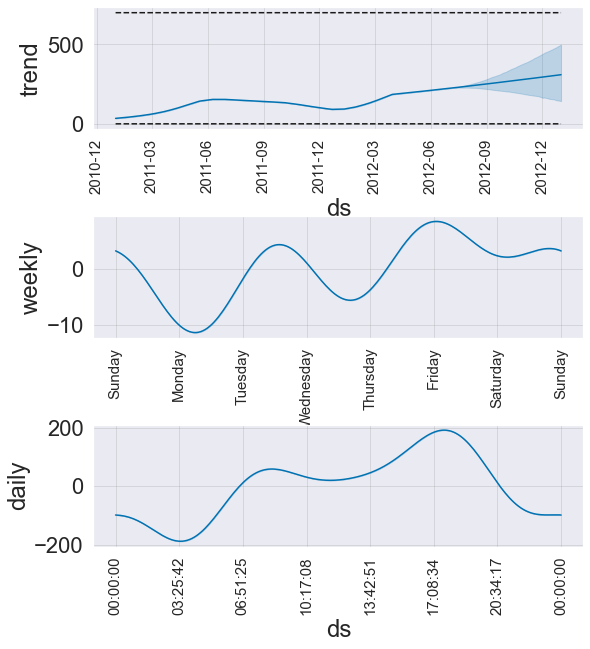

,MAE,MSE,MAPE
Train,77.45,"11,736.41",343.18
Test,127.24,"27,455.19",324.98


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  91.86520543800003


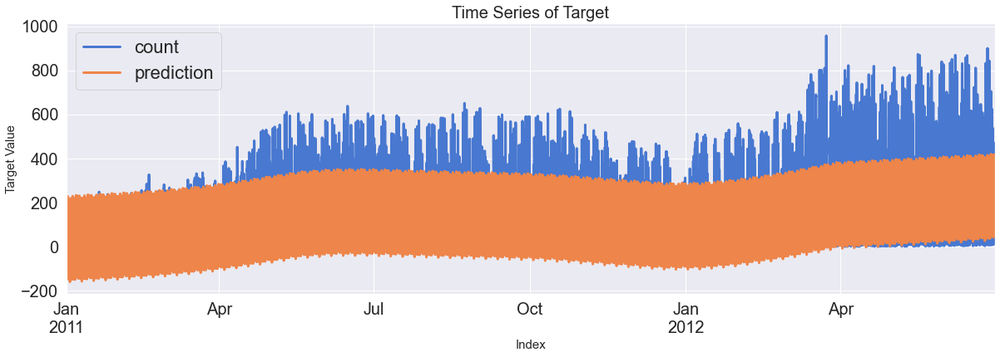

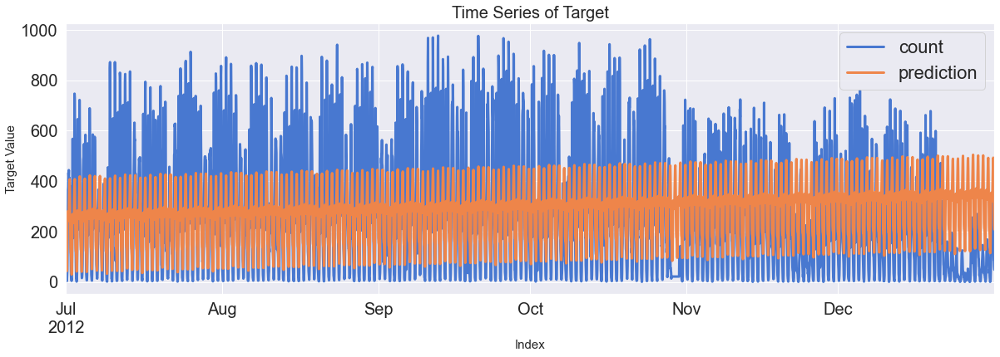

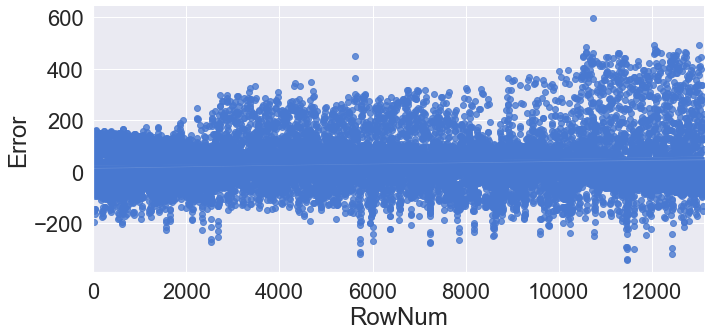

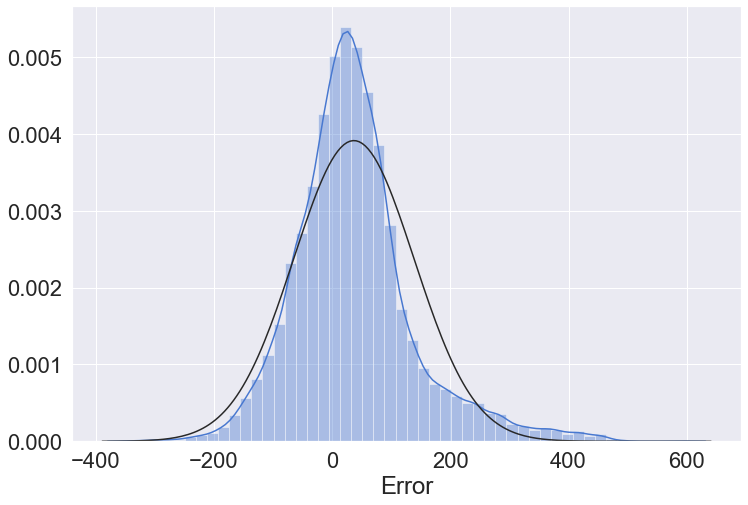

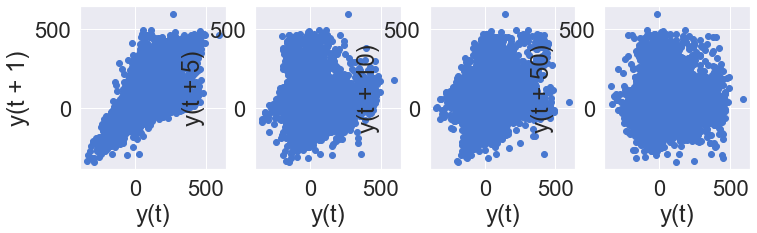

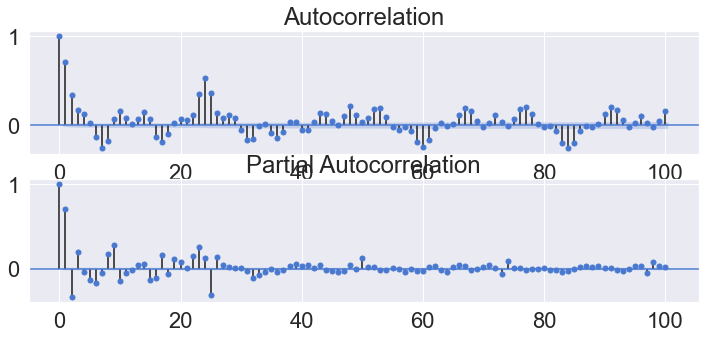

In [19]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=20.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Seasonality(add_seasonality)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-64.87,-197.71,64.57
1,2011-01-01 01:00:00,-79.01,-218.05,46.75
2,2011-01-01 02:00:00,-114.83,-237.03,13.05
3,2011-01-01 03:00:00,-149.39,-277.73,-19.61
4,2011-01-01 04:00:00,-148.72,-267.88,-22.36
...,...,...,...,...
17539,2012-12-31 19:00:00,488.28,269.50,685.76
17540,2012-12-31 20:00:00,405.67,194.77,629.96
17541,2012-12-31 21:00:00,318.44,106.61,512.15
17542,2012-12-31 22:00:00,262.36,39.18,462.80


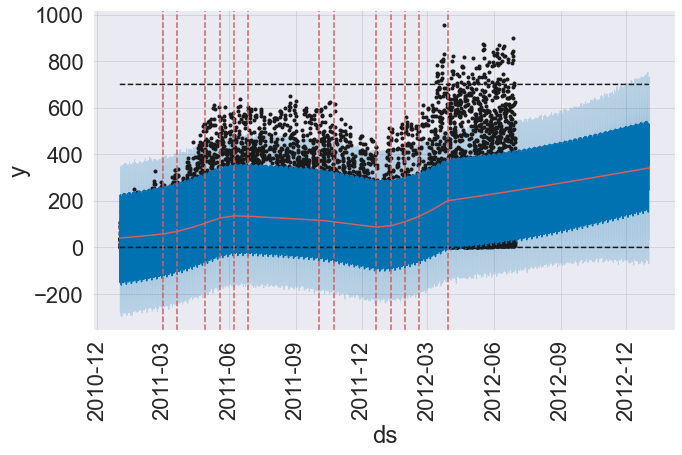

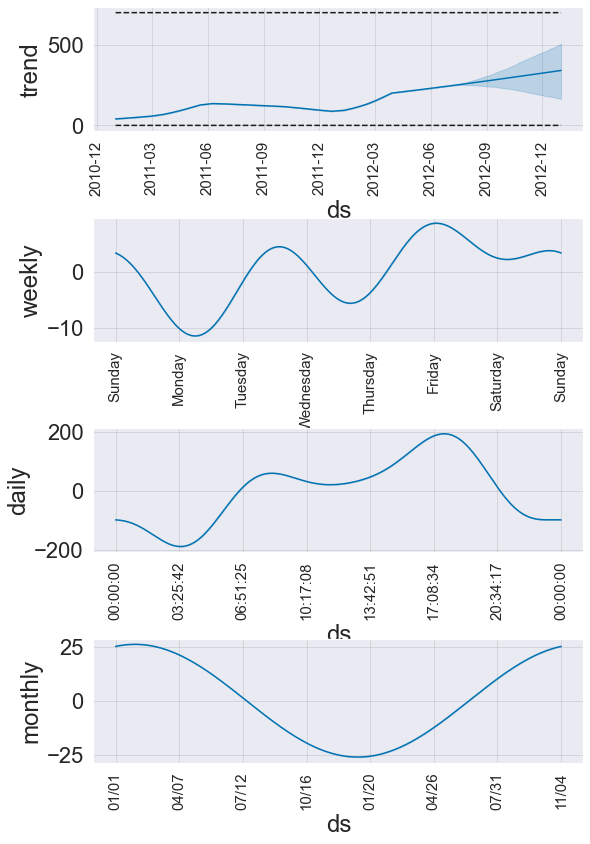

,MAE,MSE,MAPE
Train,76.93,"11,714.27",337.26
Test,134.92,"29,861.72",371.62


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  106.875337242


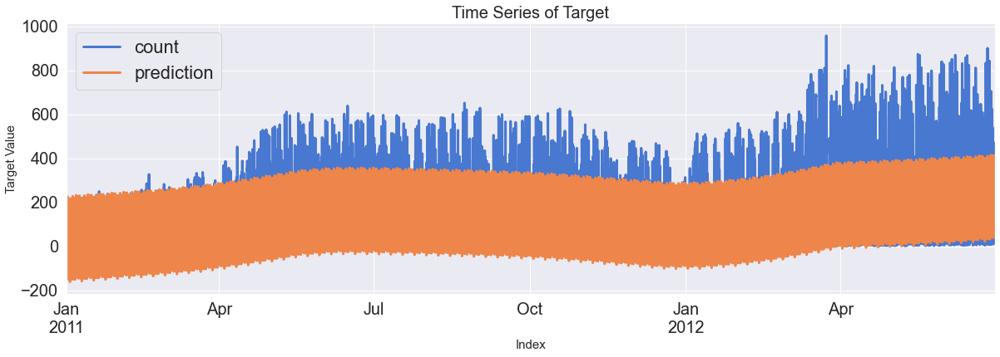

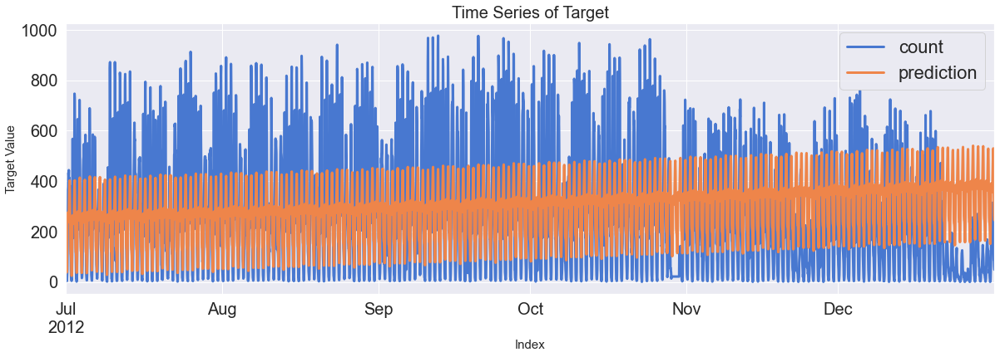

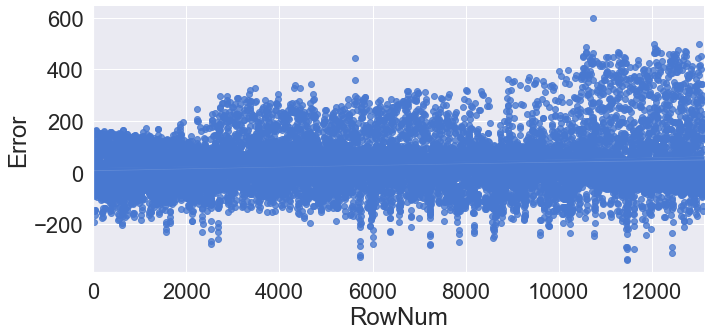

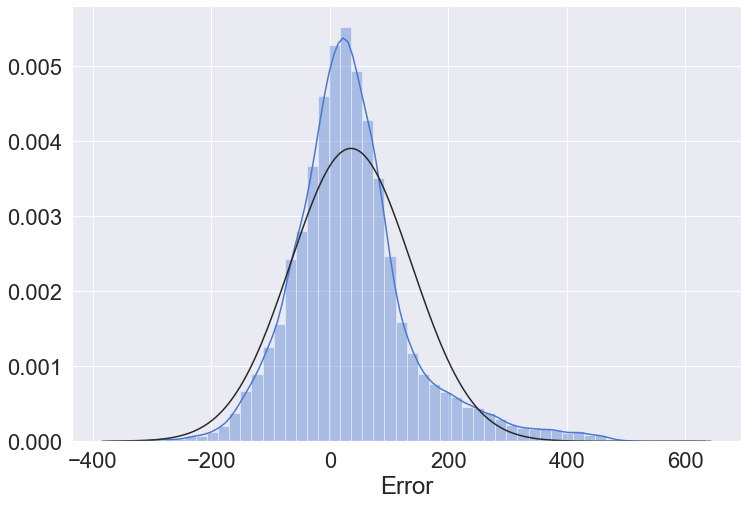

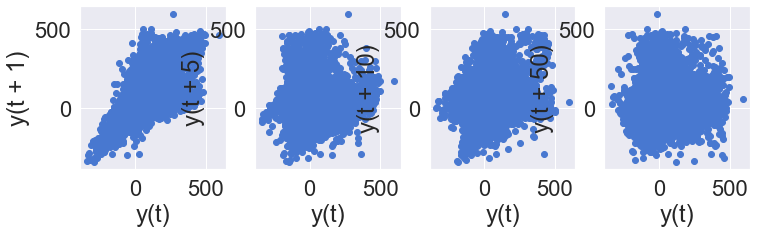

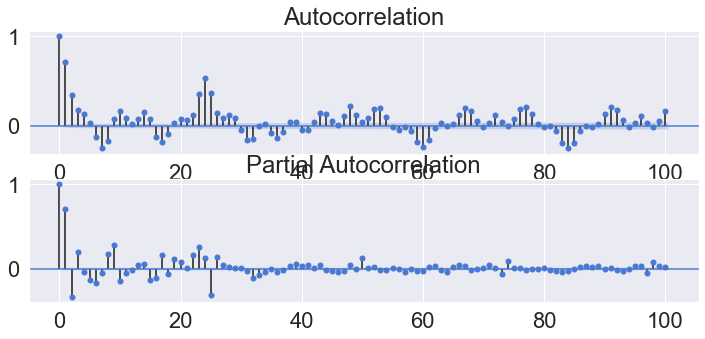

In [20]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=20.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
### monthly seasonality ###
fit_reg1_feRSM_prophet.add_seasonality(name='monthly', period=24*7*4, fourier_order=1)
###########################
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Holiday(add_country_holidays)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-77.49,-204.84,42.05
1,2011-01-01 01:00:00,-91.63,-220.27,42.93
2,2011-01-01 02:00:00,-127.44,-255.78,0.89
3,2011-01-01 03:00:00,-162.00,-306.49,-25.99
4,2011-01-01 04:00:00,-161.32,-293.32,-35.01
...,...,...,...,...
17539,2012-12-31 19:00:00,451.19,247.44,670.95
17540,2012-12-31 20:00:00,368.51,171.37,597.22
17541,2012-12-31 21:00:00,281.23,77.73,507.02
17542,2012-12-31 22:00:00,225.08,10.44,451.42


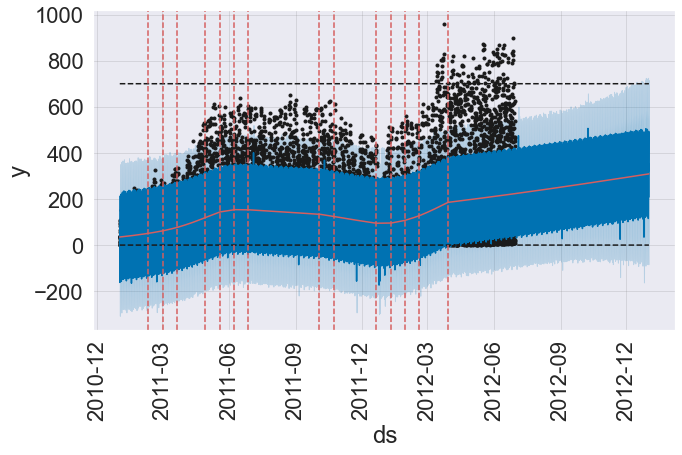

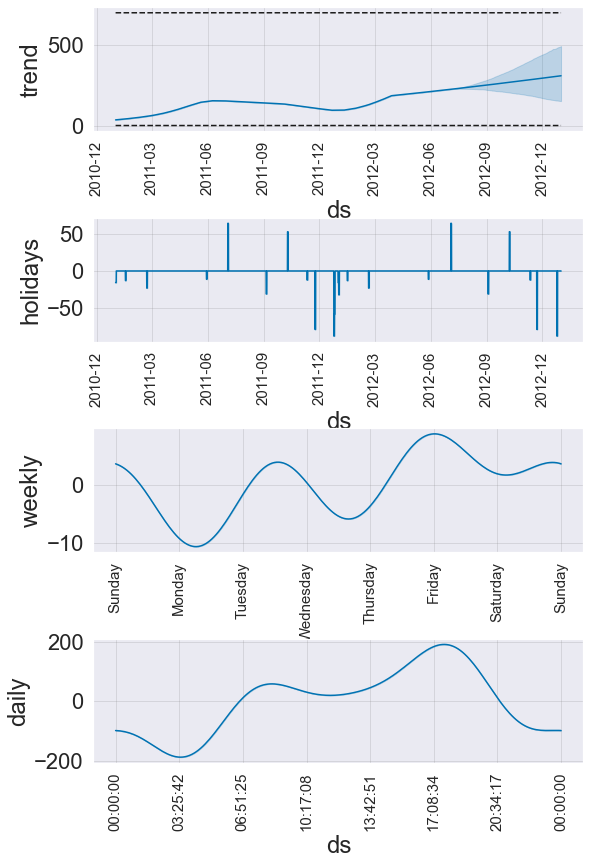

,MAE,MSE,MAPE
Train,77.28,"11,694.29",344.48
Test,126.31,"27,098.46",317.86


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  140.72887779999996


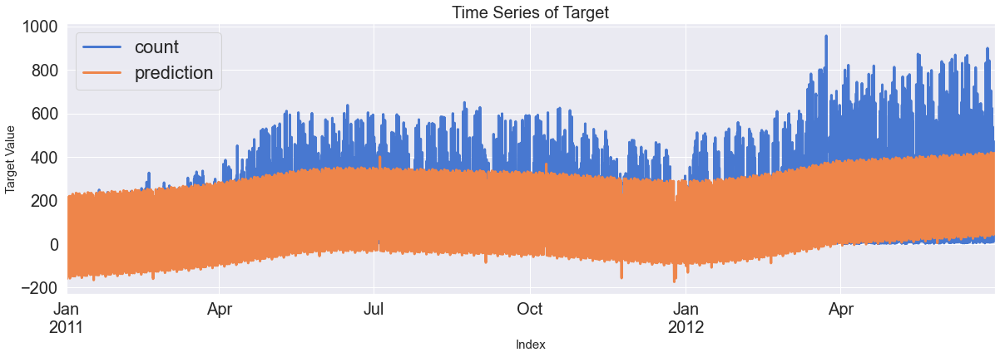

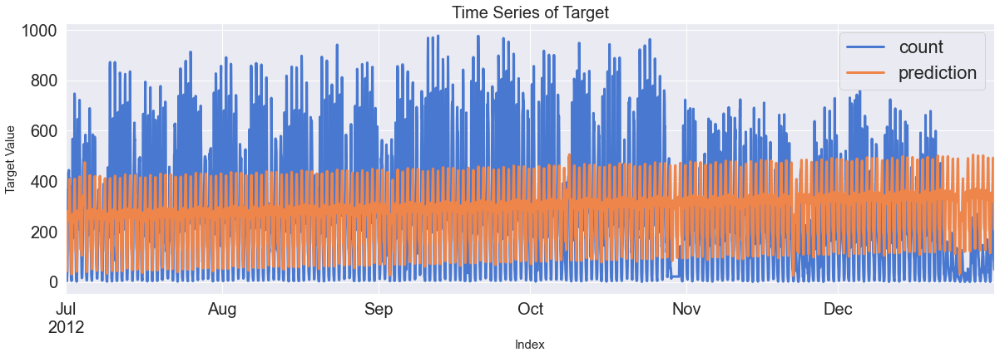

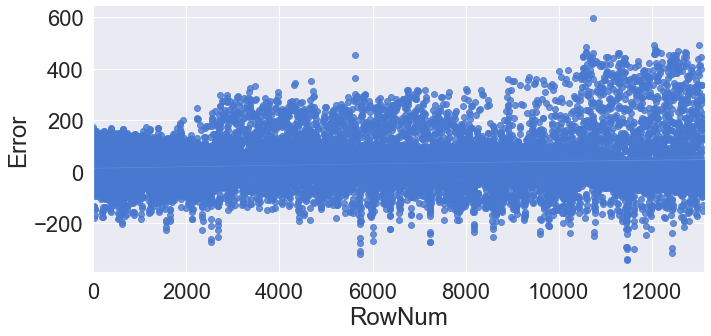

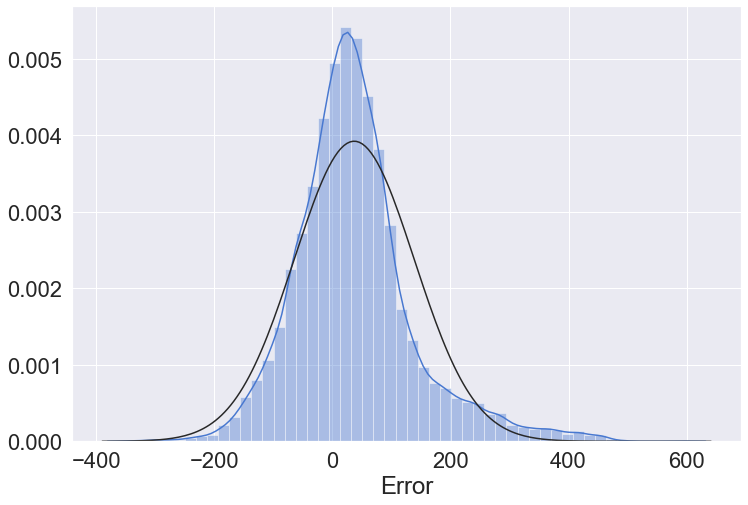

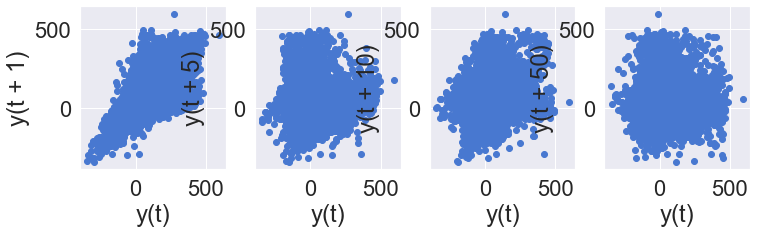

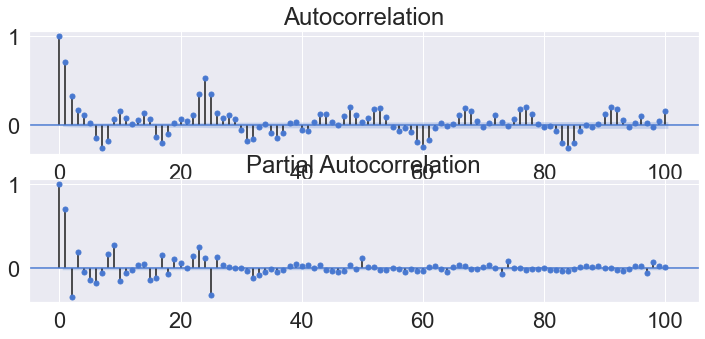

In [21]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=20.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=None, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
### holiday ###
fit_reg1_feRSM_prophet.add_country_holidays(country_name='US')
###############
### monthly seasonality ###
# fit_reg1_feRSM_prophet.add_seasonality(name='monthly', period=24*7*4, fourier_order=1)
###########################
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Holiday(custom)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-77.62,-203.31,50.47
1,2011-01-01 01:00:00,-91.77,-220.64,33.29
2,2011-01-01 02:00:00,-127.58,-248.02,11.17
3,2011-01-01 03:00:00,-162.14,-288.84,-34.50
4,2011-01-01 04:00:00,-161.45,-290.26,-33.47
...,...,...,...,...
17539,2012-12-31 19:00:00,450.26,250.12,645.59
17540,2012-12-31 20:00:00,367.57,168.10,570.35
17541,2012-12-31 21:00:00,280.29,80.27,488.36
17542,2012-12-31 22:00:00,224.14,19.35,417.99


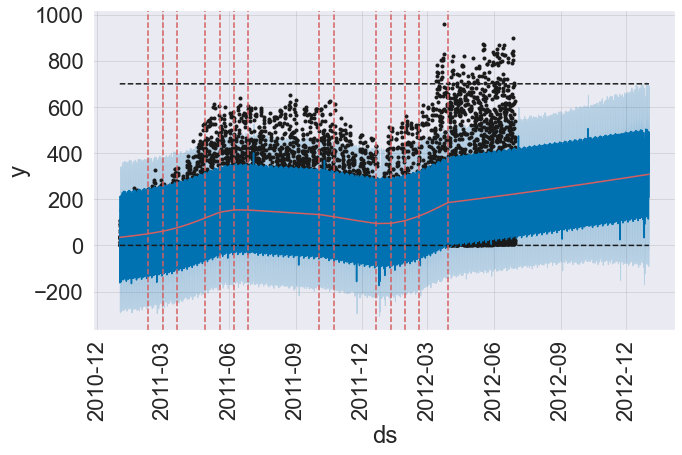

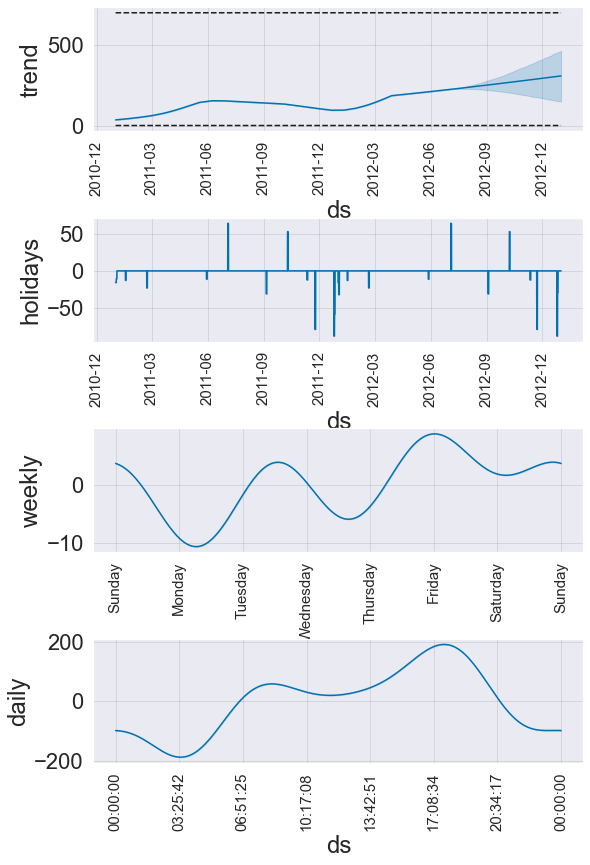

,MAE,MSE,MAPE
Train,77.28,"11,693.26",344.71
Test,125.94,"26,973.24",313.97


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  127.65982399299992


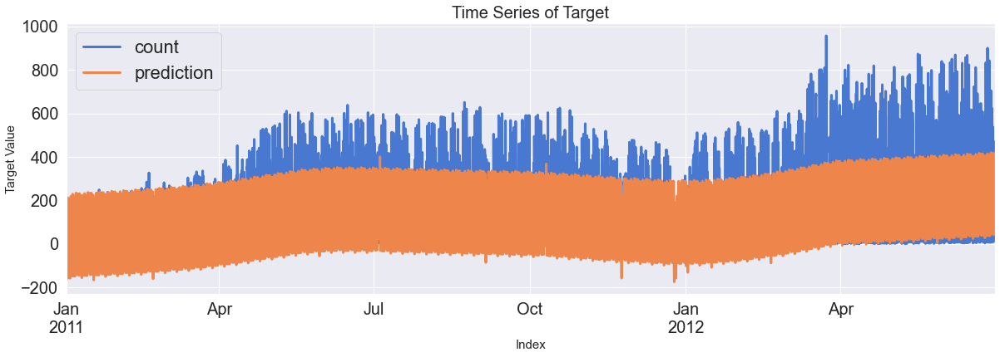

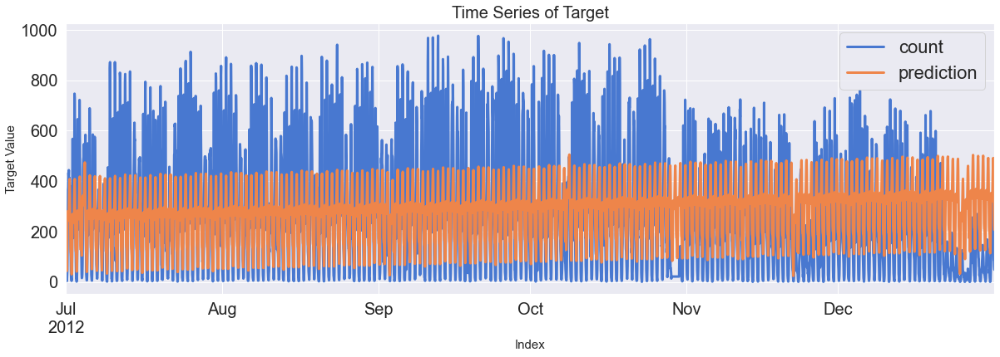

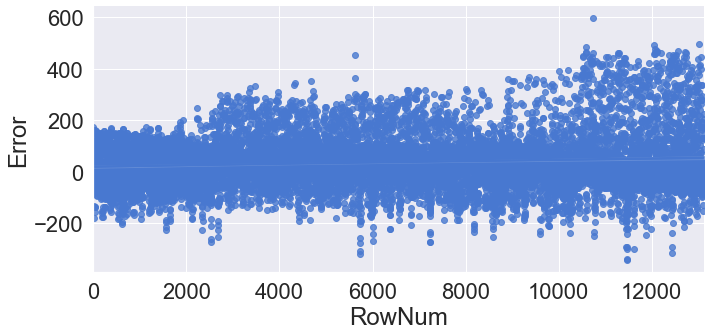

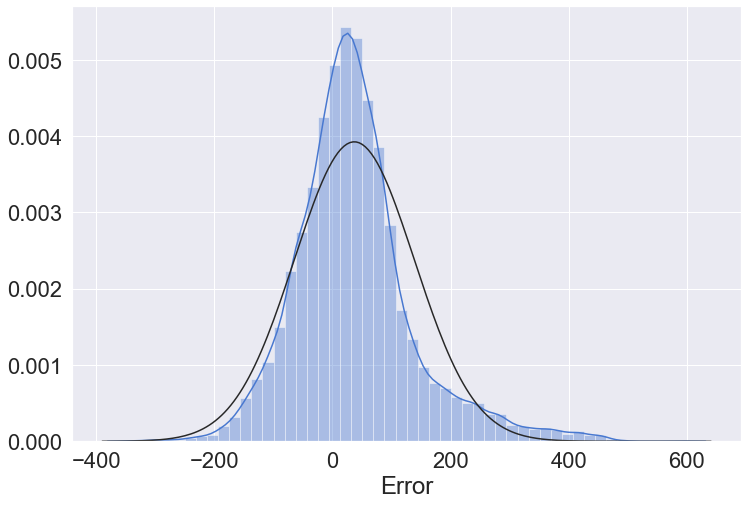

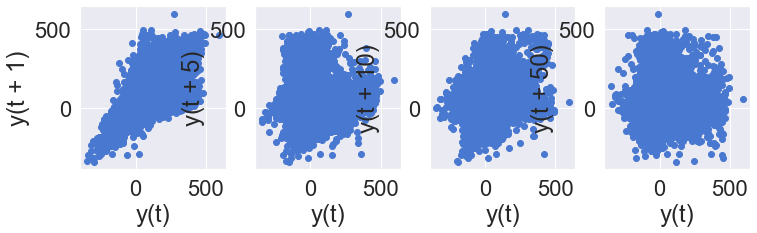

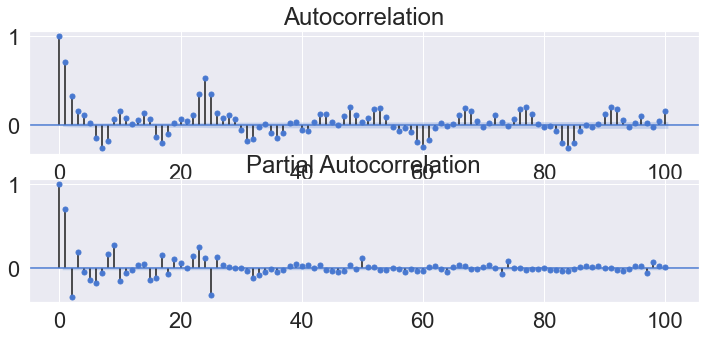

In [22]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
### holiday ###
newyear = pd.DataFrame({'holiday': 'newyear',
                        'ds': pd.to_datetime(['2011-01-01', '2012-01-01']),
                        'lower_window': 0,
                        'upper_window': 1})
christmas = pd.DataFrame({'holiday': 'christmas',
                          'ds': pd.to_datetime(['2011-12-25', '2012-12-25']),
                          'lower_window': 0,
                          'upper_window': 1})
holidays = pd.concat([newyear, christmas])
################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=20.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=holidays, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=10.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
### holiday ###
fit_reg1_feRSM_prophet.add_country_holidays(country_name='US')
###############
### monthly seasonality ###
# fit_reg1_feRSM_prophet.add_seasonality(name='monthly', period=24*7*4, fourier_order=1)
###########################
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Holiday(holidays_prior_scale)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-77.24,-209.66,51.66
1,2011-01-01 01:00:00,-91.38,-234.60,32.65
2,2011-01-01 02:00:00,-127.20,-254.28,3.27
3,2011-01-01 03:00:00,-161.75,-298.01,-23.72
4,2011-01-01 04:00:00,-161.07,-293.69,-29.60
...,...,...,...,...
17539,2012-12-31 19:00:00,449.72,258.74,670.25
17540,2012-12-31 20:00:00,367.04,174.41,591.93
17541,2012-12-31 21:00:00,279.76,81.68,515.53
17542,2012-12-31 22:00:00,223.61,35.24,446.66


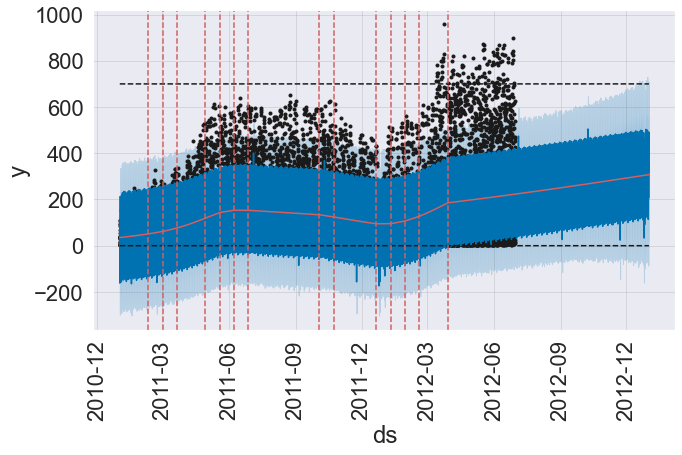

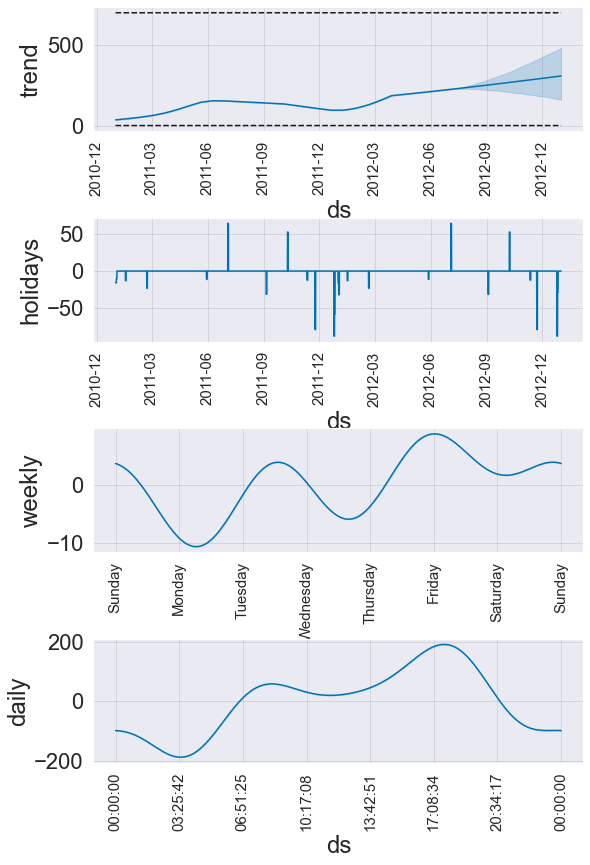

,MAE,MSE,MAPE
Train,77.28,"11,693.18",344.54
Test,125.82,"26,950.04",313.09


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  127.3476611289999


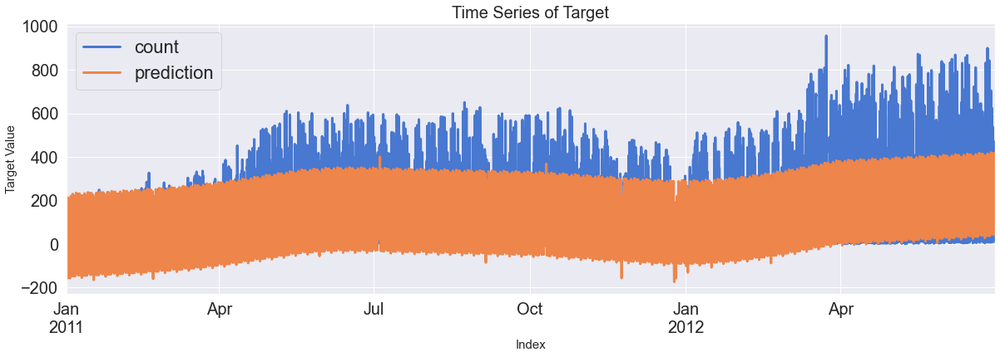

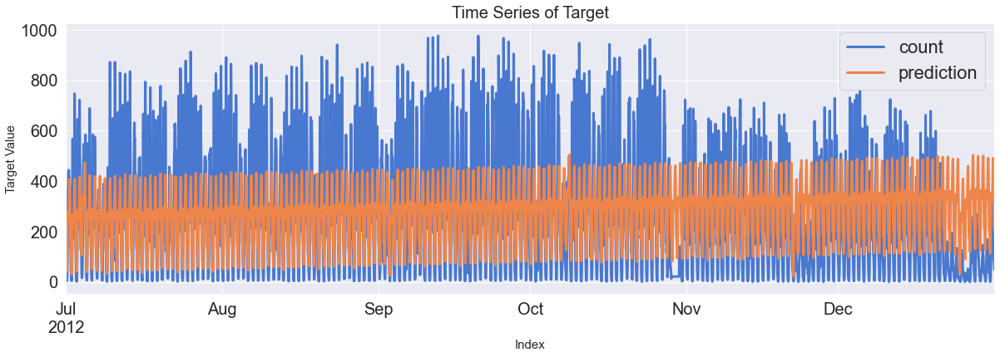

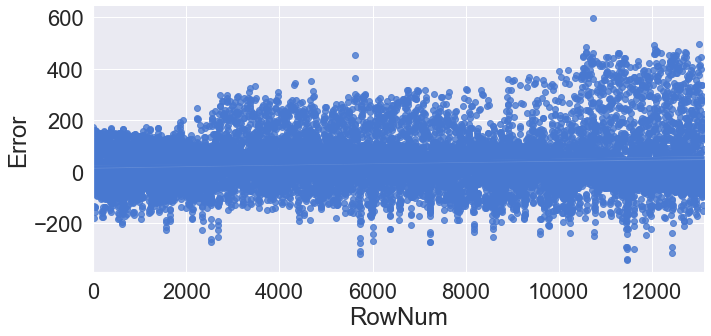

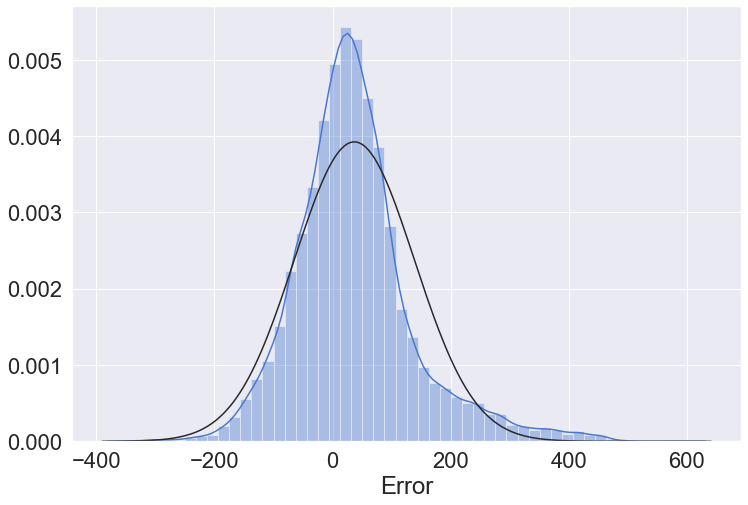

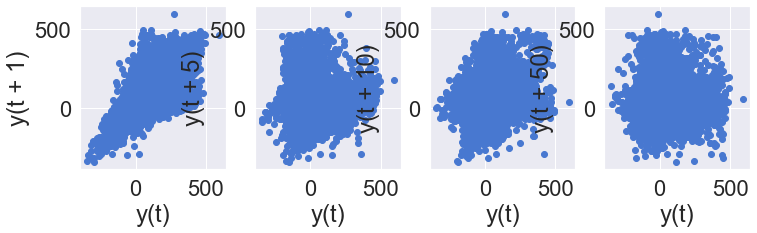

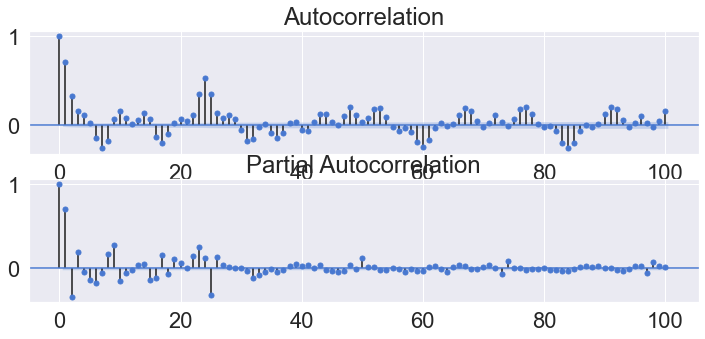

In [23]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
### holiday ###
newyear = pd.DataFrame({'holiday': 'newyear',
                        'ds': pd.to_datetime(['2011-01-01', '2012-01-01']),
                        'lower_window': 0,
                        'upper_window': 1})
christmas = pd.DataFrame({'holiday': 'christmas',
                          'ds': pd.to_datetime(['2011-12-25', '2012-12-25']),
                          'lower_window': 0,
                          'upper_window': 1})
holidays = pd.concat([newyear, christmas])
################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=20.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=holidays, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=5.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
### holiday ###
fit_reg1_feRSM_prophet.add_country_holidays(country_name='US')
###############
### monthly seasonality ###
# fit_reg1_feRSM_prophet.add_seasonality(name='monthly', period=24*7*4, fourier_order=1)
###########################
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  

## Additional Features

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01 00:00:00,-80.27,-193.71,37.47
1,2011-01-01 01:00:00,-93.93,-205.97,29.89
2,2011-01-01 02:00:00,-116.14,-233.91,12.73
3,2011-01-01 03:00:00,-137.57,-261.39,-18.77
4,2011-01-01 04:00:00,-146.98,-259.89,-23.43
...,...,...,...,...
17539,2012-12-31 19:00:00,430.46,235.19,639.51
17540,2012-12-31 20:00:00,354.49,149.36,574.45
17541,2012-12-31 21:00:00,294.62,94.36,509.34
17542,2012-12-31 22:00:00,246.67,52.14,472.72


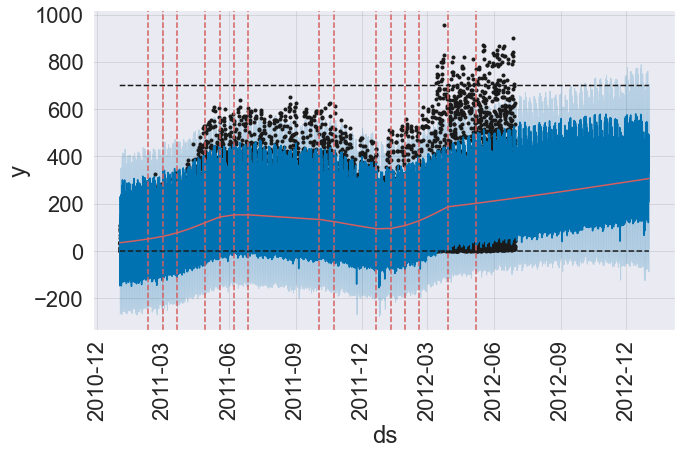

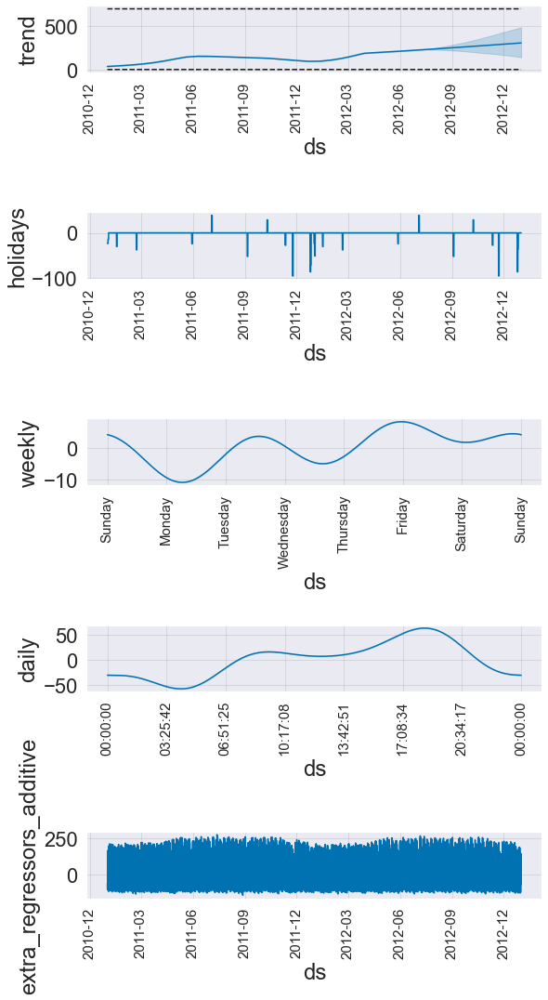

,MAE,MSE,MAPE
Train,74.03,"10,371.91",318.91
Test,122.79,"25,045.11",327.13


C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
C:\Users\KK\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1685: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Time:  255.32614081600013


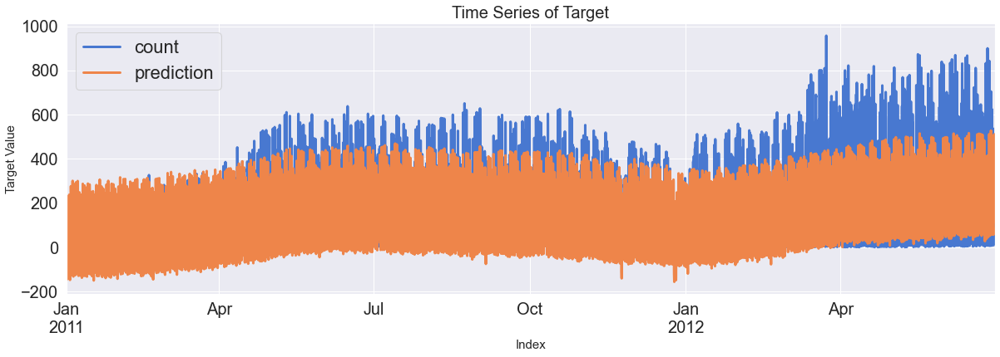

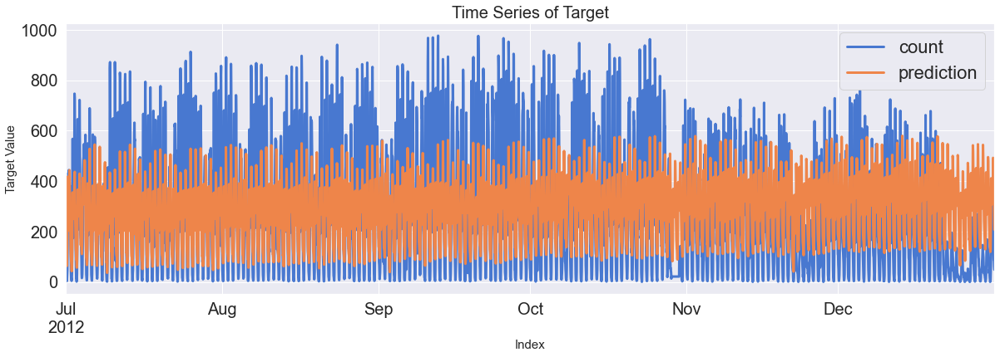

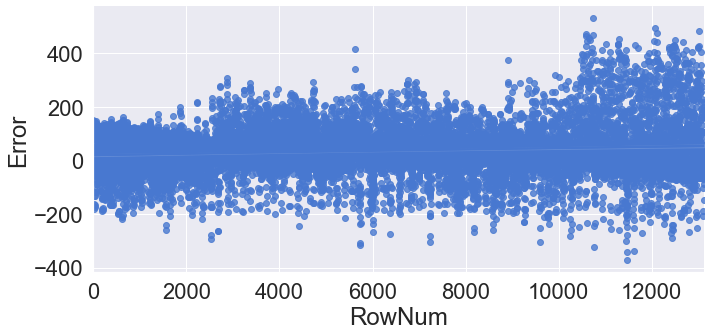

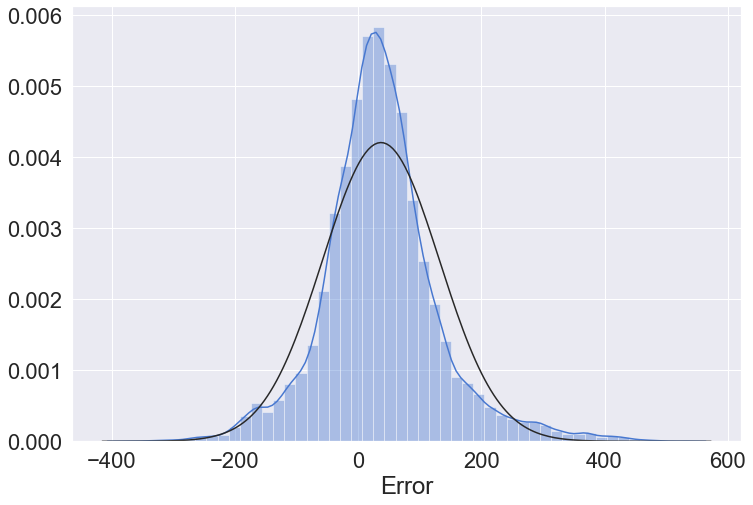

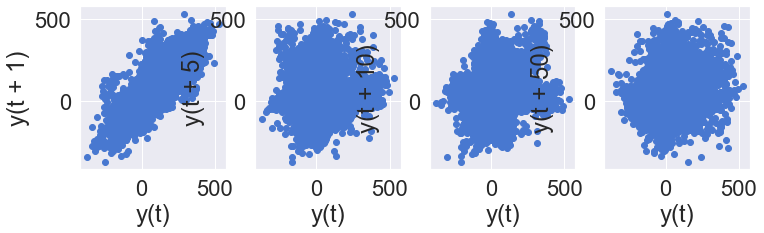

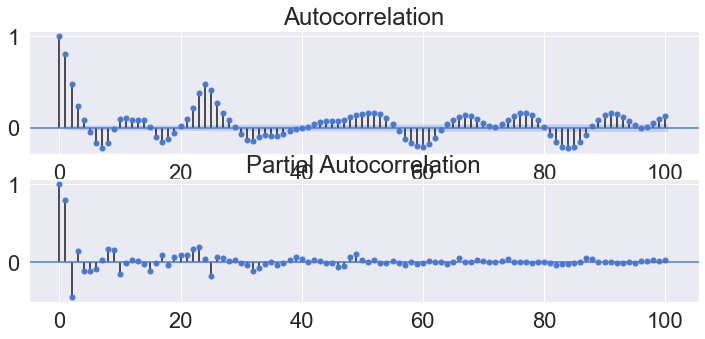

In [24]:
import timeit
start = timeit.default_timer()

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.plot import add_changepoints_to_plot

# Rearrange of Data
Y_train_feR_prophet = Y_train_feR.reset_index()
Y_train_feR_prophet.columns = ['ds', 'y']
YX_train_prophet = pd.concat([Y_train_feR_prophet, 
                              X_train_feRSM.reset_index().iloc[:,1:]], 
                              axis=1)

# Applying Prophet Model
### saturating ###
saturating = 'logistic'
if saturating == 'logistic':
    YX_train_prophet['cap'] = 900
    YX_train_prophet['floor'] = 0
##################
### holiday ###
newyear = pd.DataFrame({'holiday': 'newyear',
                        'ds': pd.to_datetime(['2011-01-01', '2012-01-01']),
                        'lower_window': 0,
                        'upper_window': 1})
christmas = pd.DataFrame({'holiday': 'christmas',
                          'ds': pd.to_datetime(['2011-12-25', '2012-12-25']),
                          'lower_window': 0,
                          'upper_window': 1})
holidays = pd.concat([newyear, christmas])
################
fit_reg1_feRSM_prophet = Prophet(growth=saturating,
                                 # Trend
                                 changepoints=None, # CP가 발생하는 시점들의 list ['2012-01-01']
                                 n_changepoints=25, # CP의 수
                                 changepoint_range=0.9, # CP의 기존 데이터 수 대비 최대 비율
                                 changepoint_prior_scale=0.5, # CP 추정 민감도로 높을수록 민감
                                 # Seasonality
                                 seasonality_mode='additive', # 계절성 모델: 'additive' or 'multiplicative'
                                 seasonality_prior_scale=20.0, # 계절성 추정 민감도로 높을수록 민감
                                 yearly_seasonality='auto', # 연계절성
                                 weekly_seasonality='auto', # 월계절성
                                 daily_seasonality='auto', #일계절성
                                 # Holiday
                                 holidays=holidays, # 휴일 또는 이벤트 시점 dataframe
                                 holidays_prior_scale=5.0, # 휴일 추정 민감도로 높을수록 민감
                                 # Others
                                 interval_width=0.8, # 추세 예측 정확도 구간범위
                                 mcmc_samples=0) # 계절성 예측 정확도 제어
### holiday ###
fit_reg1_feRSM_prophet.add_country_holidays(country_name='US')
###############
### monthly seasonality ###
# fit_reg1_feRSM_prophet.add_seasonality(name='monthly', period=24*7*4, fourier_order=1)
###########################
### extra feature ###
target_name = X_train_feRSM.columns[:5]
for col in target_name:
    fit_reg1_feRSM_prophet.add_regressor(col)
#####################
fit_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.fit(YX_train_prophet)
forecast = fit_reg1_feRSM_prophet.make_future_dataframe(freq='H', 
                                                        periods=Y_test_feR.shape[0])
### saturating ###
if saturating == 'logistic':
    forecast['cap'] = 700
    forecast['floor'] = 0
##################
### extra feature ###
forecast = pd.concat([forecast, 
                      pd.concat([X_train_feRSM[target_name], 
                                 X_test_feRSM[target_name]], axis=0).reset_index().iloc[:,1:]], 
                      axis=1)
#####################
pred_reg1_feRSM_prophet = fit_reg1_feRSM_prophet.predict(forecast)
pred_tr_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[:Y_train_feR.shape[0]-1, ['yhat']])
pred_te_reg1_feRSM_prophet = np.ravel(pred_reg1_feRSM_prophet.loc[Y_train_feR.shape[0]:, ['yhat']])

# Result
display(pred_reg1_feRSM_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

fig = fit_reg1_feRSM_prophet.plot(pred_reg1_feRSM_prophet)
add_changepoints_to_plot(fig.gca(), fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet)
plt.xticks(rotation=90)
plt.show()

fig = fit_reg1_feRSM_prophet.plot_components(pred_reg1_feRSM_prophet)
ax = fig.get_axes()
for i in range(len(ax)):
    ax[i].tick_params(axis="x", labelsize=15, rotation=90)
plt.show()

## using plotly
# display(plot_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))
# display(plot_components_plotly(fit_reg1_feRSM_prophet, pred_reg1_feRSM_prophet))

# Evaluation
Score_reg1_feRSM_prophet, \
Resid_tr_reg1_feRSM_prophet, \
Resid_te_reg1_feRSM_prophet = evaluation_trte(Y_train_feR, 
                                              pred_tr_reg1_feRSM_prophet,
                                              Y_test_feR, 
                                              pred_te_reg1_feRSM_prophet, 
                                              graph_on=True)
display(Score_reg1_feRSM_prophet)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM_prophet, ['Error'], X_train_feRSM, graph_on=True)

stop = timeit.default_timer()
print('Time: ', stop - start)  